In [1]:
! scp -r yroussel@bbpv1.epfl.ch:/gpfs/bbp.cscs.ch/data/project/proj84/csaba/aibs_10x_mouse_wholebrain/results/density_calculations_3/scaled_densities_t_types_as_keys.pickle ./

scaled_densities_t_types_as_keys.pickle       100% 2200KB   3.5MB/s   00:00    


In [2]:
import pickle

# Open the pickle file in binary read mode
with open('./scaled_densities_t_types_as_keys.pickle', 'rb') as file:
    # Load the data from the file
    data = pickle.load(file)

# Now you can use the data variable which contains the deserialized object
print(data)

{'0001 CLA-EPd-CTX Car3 Glut_1':                 density_mm3
AId5              72.814382
AId6a           1421.510956
AId6b           5415.989595
AIp5             230.298620
AIp6a           1420.396383
...                     ...
cing              55.329682
ee              3547.768284
fa              1266.794748
fp                22.898910
scwmunassigned   728.643576

[65 rows x 1 columns], '0002 CLA-EPd-CTX Car3 Glut_1':                  density_mm3
AId5                9.101798
AId6a             643.064480
AId6b            2407.106486
AIp5              131.599211
AIp6a            2319.014504
...                      ...
ccs               185.647655
ee              18093.618248
fa               1593.709522
fp                 45.797820
scwmunassigned    355.435891

[67 rows x 1 columns], '0003 CLA-EPd-CTX Car3 Glut_1':                 density_mm3
AId23            100.005068
AId5             291.257529
AId6a           4298.378367
AId6b           6920.431149
AIp23             15.500898
...

In [3]:
sorted_data = {k: data[k] for k in sorted(data)}

In [4]:
import pandas as pd

def concatenate_dataframes(dataframes_dict):
    """
    Concatenates a dictionary of DataFrames into a single DataFrame.
    
    Parameters:
    - dataframes_dict (dict): Dictionary where keys are strings and values are DataFrames with a single column named 'density'.
    
    Returns:
    - pd.DataFrame: A single concatenated DataFrame with columns renamed to the keys of the input dictionary.
    """
    # Create an empty list to hold the renamed DataFrames
    renamed_dfs = []
    
    # Iterate over the dictionary
    for key, df in dataframes_dict.items():
        # Rename the 'density' column to the key
        renamed_df = df.rename(columns={'density_mm3': key})
        # Append the renamed DataFrame to the list
        renamed_dfs.append(renamed_df)
    
    # Concatenate all DataFrames along the columns
    concatenated_df = pd.concat(renamed_dfs, axis=1)
    
    return concatenated_df

In [5]:
densities_df = concatenate_dataframes(sorted_data)
t_tpes_dict = {x: x.replace(" ", "_") for x in densities_df.columns}
densities_df = densities_df.rename(t_tpes_dict, axis=1)
densities_df

,0001_CLA-EPd-CTX_Car3_Glut_1,0002_CLA-EPd-CTX_Car3_Glut_1,0003_CLA-EPd-CTX_Car3_Glut_1,0004_CLA-EPd-CTX_Car3_Glut_1,0005_CLA-EPd-CTX_Car3_Glut_2,0006_IT_EP-CLA_Glut_1,0007_IT_EP-CLA_Glut_1,0008_IT_EP-CLA_Glut_1,0009_IT_EP-CLA_Glut_1,0010_IT_EP-CLA_Glut_1,...,5313_BAM_NN_1,5314_BAM_NN_1,5315_Monocytes_NN_1,5316_DC_NN_1,5317_DC_NN_1,5318_DC_NN_1,5319_B_cells_NN_1,5320_ILC_NN_2,5321_NK_cells_NN_3,5322_T_cells_NN_4
AId5,72.814382,9.101798,291.257529,391.377305,72.814382,9.101798,NaN,NaN,9.101798,NaN,...,NaN,36.248958,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.124479
AId6a,1421.510956,643.064480,4298.378367,3976.846127,676.909979,473.836985,118.459246,1150.746964,169.227495,236.918493,...,NaN,67.396799,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.698399
AId6b,5415.989595,2407.106486,6920.431149,7823.096081,1805.329865,601.776622,300.888311,6920.431149,601.776622,1805.329865,...,NaN,599.161174,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AIp5,230.298620,131.599211,213.848719,NaN,871.844776,148.049113,49.349704,115.149310,NaN,148.049113,...,NaN,65.513627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AIp6a,1420.396383,2319.014504,1043.556527,28.987681,2927.755811,898.618120,5942.474665,869.630439,260.889132,521.778263,...,NaN,173.170169,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ANcr2purkinjelayer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CENT2purkinjelayer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CENT3purkinjelayer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SIMpurkinjelayer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
for x in densities_df.index:
    print(x)

AId5
AId6a
AId6b
AIp5
AIp6a
AIv23
AIv5
AIv6a
AIv6b
AON
AUDd6a
AUDd6b
AUDp5
AUDp6a
AUDp6b
AUDv5
AUDv6a
AUDv6b
CLA
CP
CTXspunassigned
ECT5
ECT6a
ENTl5
ENTl6a
EPd
FRP6a
GU4
GU5
GU6a
GU6b
MOp6a
MOp6b
MOs6a
OLFunassigned
ORBl23
ORBl5
ORBl6a
ORBl6b
PIR
SSpbfd6a
SSpm6a
SSpm6b
SSpn6a
SSs5
SSs6a
SSs6b
TEa5
TEa6a
TEa6b
VISC5
VISC6a
VISC6b
VISli6a
VISp6a
VISp6b
VISpor5
aco
ccb
ccs
cing
ee
fa
fp
scwmunassigned
AIp6b
AUDpo5
AUDpo6a
AUDv4
CA1so
ECT23
ECT6b
EPv
LA
PERI23
PERI5
POST
TEa4
VISal6b
VISl6b
VISli6b
VISpl5
VISpor6a
VLunassigned
amc
AId23
AIp23
APr
AUDd5
AUDpo4
AUDpo6b
AUDv23
MOp23
MOp5
MOs6b
SSpm4
SSpm5
SSs4
TEa23
VISC23
VISC4
VISli23
VISli5
VISpl4
VISpor23
VISpor4
AIv1
AUDd23
AUDd4
AUDp23
AUDp4
AUDpo23
MOs5
ORBl1
RSPagl6a
RSPd5
SSpbfd23
SSpbfd4
SSpbfd5
SSpbfd6b
SSpn4
SSpn5
SSpn6b
SSs23
VISal5
VISal6a
VISl23
VISl4
VISl5
VISl6a
VISli4
VISp4
VISp5
VISpl23
VISpl6a
VISrl5
VISrl6a
STRunassigned
ACAv23
ACAv5
DP
ENTm6
ILA23
ILA5
ILA6a
ORBm5
ORBvl23
PL6a
RSPd6a
SUB
alv
ccg
PERI6a
PERI6b
brainunassi

In [7]:
extended_p_me_t = pd.read_csv("../probabilistic_mapping_extention/extended_p_me_t.csv", index_col=0)

In [8]:
import numpy as np
np.sum(extended_p_me_t, axis=1)

0008_IT_EP-CLA_Glut_1    0.0
0020_IT_EP-CLA_Glut_3    0.0
0042_L6_IT_CTX_Glut_2    1.0
0049_L6_IT_CTX_Glut_4    1.0
0054_L6_IT_CTX_Glut_5    0.0
                        ... 
5318_DC_NN_1             3.0
5319_B_cells_NN_1        3.0
5320_ILC_NN_2            3.0
5321_NK_cells_NN_3       3.0
5322_T_cells_NN_4        3.0
Length: 5322, dtype: float64

In [9]:
common_t_types = extended_p_me_t.index.intersection(densities_df.columns)
msk_t_types = np.asarray([("IMN" not in x) & ("NN" not in x) for x in common_t_types])
common_t_types = common_t_types[msk_t_types]

extended_p_me_t = extended_p_me_t.reindex(common_t_types, axis=0)
densities_df = densities_df.reindex(common_t_types, axis=1)

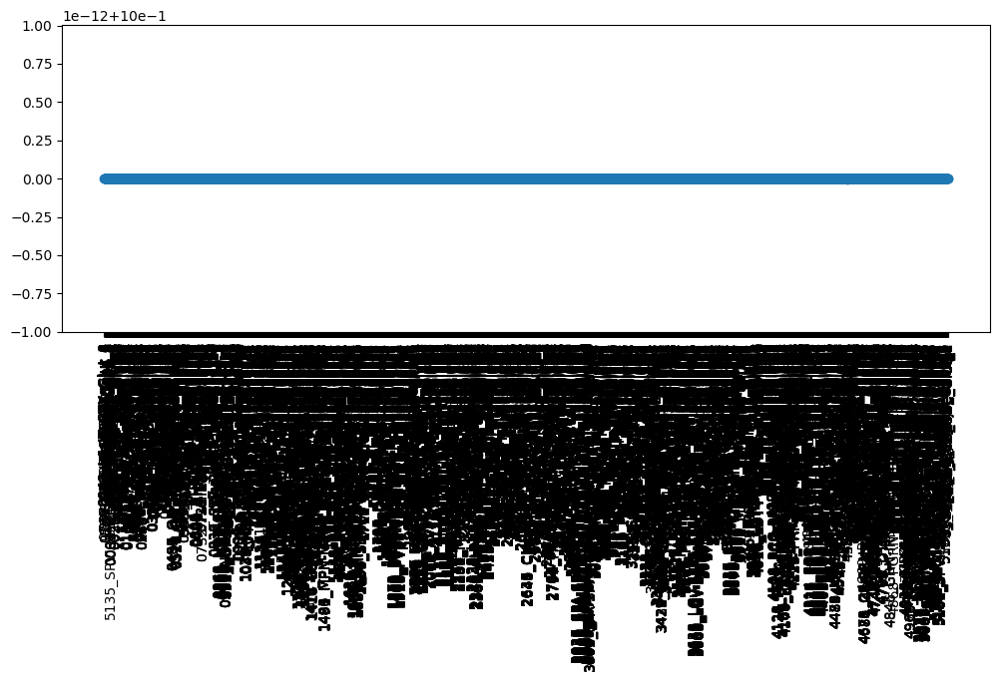

In [42]:
msk_t_type = common_t_types[extended_p_me_t.T.fillna(0).sum() > 0]

plt.figure(figsize=(12,4))
plt.plot(extended_p_me_t.T[msk_t_type].fillna(0).sum(), 'o')
plt.xticks(rotation=90)
plt.show()

In [43]:
extended_p_me_t = extended_p_me_t.reindex(msk_t_type, axis=0)
densities_df = densities_df.reindex(msk_t_type, axis=1)

In [10]:
np.unique(np.asarray([x.split("_")[-2] for x in common_t_types]))

array(['Chol', 'Dopa', 'Dopa-Gaba', 'Gaba', 'Gaba-Chol', 'Gaba-Glut',
       'Glut', 'Glut-Chol', 'Glut-Sero', 'Gly-Gaba', 'Glyc-Gaba',
       'Hist-Gaba'], dtype='<U9')

In [44]:
np.sum(extended_p_me_t, axis=1)

0042_L6_IT_CTX_Glut_2        1.0
0049_L6_IT_CTX_Glut_4        1.0
0063_L5_IT_CTX_Glut_4        1.0
0247_LA-BLA-BMA-PA_Glut_5    1.0
0288_CA1-ProS_Glut_4         1.0
                            ... 
5201_CB_Granule_Glut_2       1.0
5202_DCO_UBC_Glut_1          1.0
5203_DCO_UBC_Glut_1          1.0
5204_DCO_UBC_Glut_1          1.0
5205_DCO_UBC_Glut_1          1.0
Length: 4757, dtype: float64

In [45]:
extended_p_me_t = extended_p_me_t.div(np.sum(extended_p_me_t, axis=1), axis=0)
np.sum(extended_p_me_t, axis=1)

0042_L6_IT_CTX_Glut_2        1.0
0049_L6_IT_CTX_Glut_4        1.0
0063_L5_IT_CTX_Glut_4        1.0
0247_LA-BLA-BMA-PA_Glut_5    1.0
0288_CA1-ProS_Glut_4         1.0
                            ... 
5201_CB_Granule_Glut_2       1.0
5202_DCO_UBC_Glut_1          1.0
5203_DCO_UBC_Glut_1          1.0
5204_DCO_UBC_Glut_1          1.0
5205_DCO_UBC_Glut_1          1.0
Length: 4757, dtype: float64

In [46]:
t_types_densities = densities_df[~densities_df.index.str.contains('unassigned')].fillna(0)

me_types_densities = t_types_densities @ extended_p_me_t.fillna(0)
me_types_densities

,IN_dend_0_ax_0|bAC,IN_dend_0_ax_2|bAC,IN_dend_0_ax_3|bAC,IN_dend_0_ax_4|bAC,IN_dend_0_ax_5|bAC,IN_dend_0_ax_6|bAC,IN_dend_0_ax_8|bAC,IN_dend_0_ax_9|bAC,IN_dend_1_ax_0|bAC,IN_dend_1_ax_1|bAC,...,PC_dend_2_ax_7|dSTUT,PC_dend_2_ax_8|dSTUT,PC_dend_3_ax_0|dSTUT,PC_dend_3_ax_4|dSTUT,PC_dend_3_ax_6|dSTUT,PC_dend_3_ax_7|dSTUT,PC_dend_3_ax_8|dSTUT,PC_dend_8_ax_4|dSTUT,PC_dend_8_ax_7|dSTUT,PC_dend_8_ax_8|dSTUT
AId5,0.490255,0.0,111.467594,22.938932,11.728179,19.205543,27.564783,1.470764,3.888673,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AId6a,2.483041,0.0,47.473315,41.476377,11.496801,30.706607,21.575971,7.449123,7.247700,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AId6b,2.010751,0.0,16.293606,24.375447,0.000000,21.010783,23.478412,6.032252,37.930345,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AIp5,0.967072,0.0,65.461892,17.718565,4.775013,16.379816,17.071103,2.901216,4.165066,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AIp6a,1.686398,0.0,33.207664,48.974658,1.611274,16.970210,23.180011,5.059193,4.277302,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ANcr1purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,46.040573,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ANcr2purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,53.433423,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CENT2purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,78.643878,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CENT3purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,65.418397,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [47]:
import matplotlib.pyplot as plt

def plot_map(data, title, filename):
    """Plot and save heatmap of data."""
    plt.figure(figsize=(60, 60))
    heatmap = plt.pcolor(data.values, cmap="jet")

    # for y in range(data.shape[0]):
    #     for x in range(data.shape[1]):
    #         if 0 < data.values[y, x] < 1.:
    #             plt.text(x + 0.5, y + 0.5, int(100 * data.values[y, x]),
    #                      horizontalalignment='center',
    #                      verticalalignment='center')

    plt.colorbar(heatmap)
    plt.xticks(np.arange(len(data.columns)) + .5, data.columns, rotation=90)
    plt.yticks(np.arange(len(data.index)) + .5, data.index)
    plt.title(title)
    plt.savefig(filename)

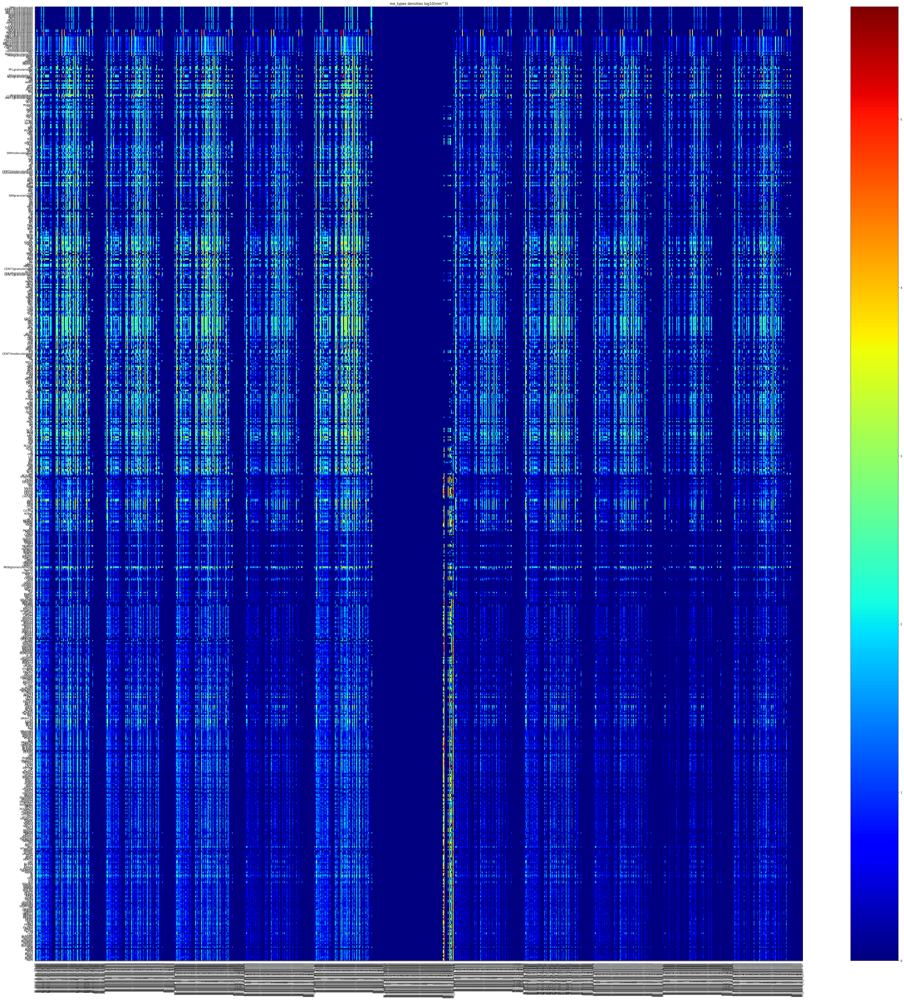

In [48]:
plot_map(np.log10(me_types_densities + 1.), "me_types densities log10(mm^3)", "me_types_densities.png")

In [49]:
# Split the column names to separate "m-type" and "e-type"
me_types_densities.columns = pd.MultiIndex.from_tuples([col.split('|') for col in me_types_densities.columns], names=['m-type', 'e-type'])

# Sum the columns within each "e-type" group
e_types_densities = me_types_densities.T.groupby(level='e-type').sum().T

# Sum the columns within each "m-type" group
m_types_densities = me_types_densities.T.groupby(level='m-type').sum().T

In [50]:
me_types_densities.to_csv("./brain_regions_me_types_composition.csv")

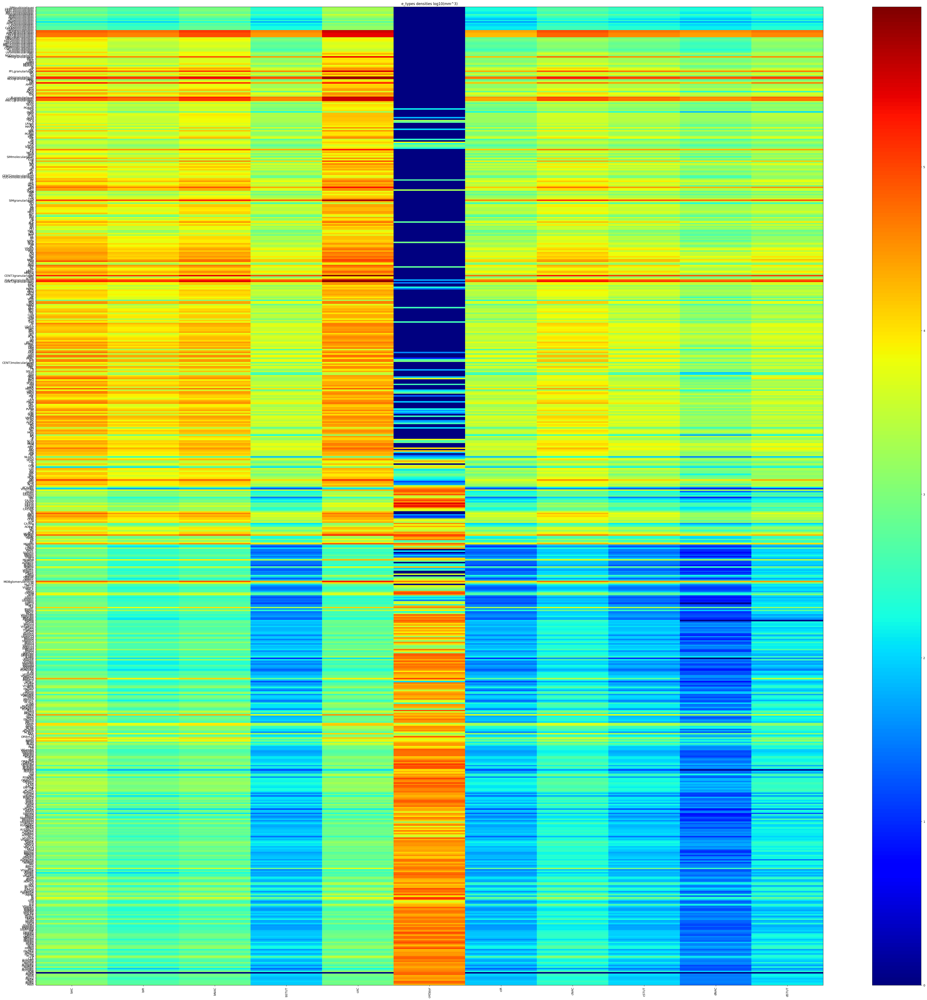

In [51]:
plot_map(np.log10(e_types_densities + 1.), "e_types densities log10(mm^3)", "e_types_densities.png")

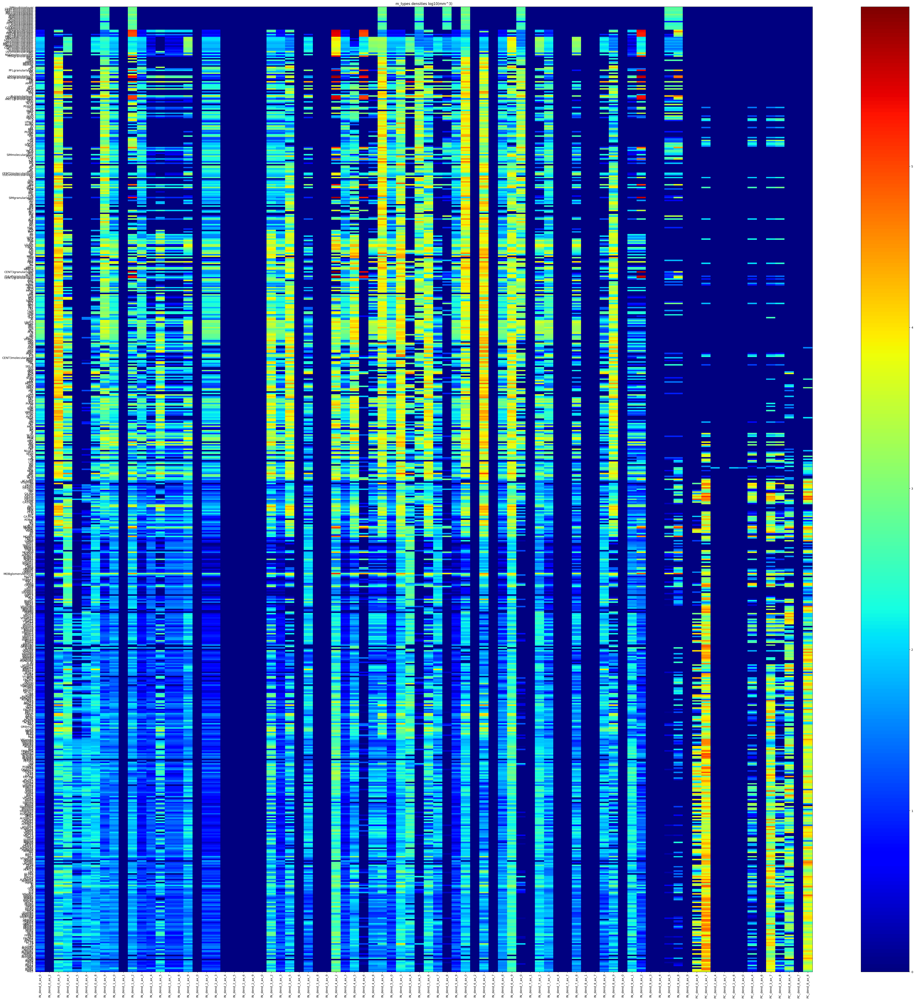

In [52]:
plot_map(np.log10(m_types_densities + 1.), "m_types densities log10(mm^3)", "m_types_densities.png")

In [20]:
import pandas as pd
import umap
import matplotlib.pyplot as plt

def plot_umap(df):
    """
    Plot a UMAP of the dataset and print the sample names next to the datapoints.
    
    Parameters:
    df (pd.DataFrame): Input dataframe with sample names as the index and feature values as the values.
    """
    # Initialize UMAP model
    reducer = umap.UMAP()
    
    # Fit and transform the data
    embedding = reducer.fit_transform(df.values)
    
    # Create a scatter plot
    plt.figure(figsize=(8, 8))
    plt.scatter(embedding[:, 0], embedding[:, 1], s=100, alpha=0.5)
    
    # Annotate points with sample names
    for i, sample_name in enumerate(df.index):
        plt.annotate(sample_name, (embedding[i, 0], embedding[i, 1]), fontsize=9, alpha=0.75)
    
    # Set plot title and labels
    plt.title('UMAP projection of the dataset')
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    
    # Show the plot
    plt.show()

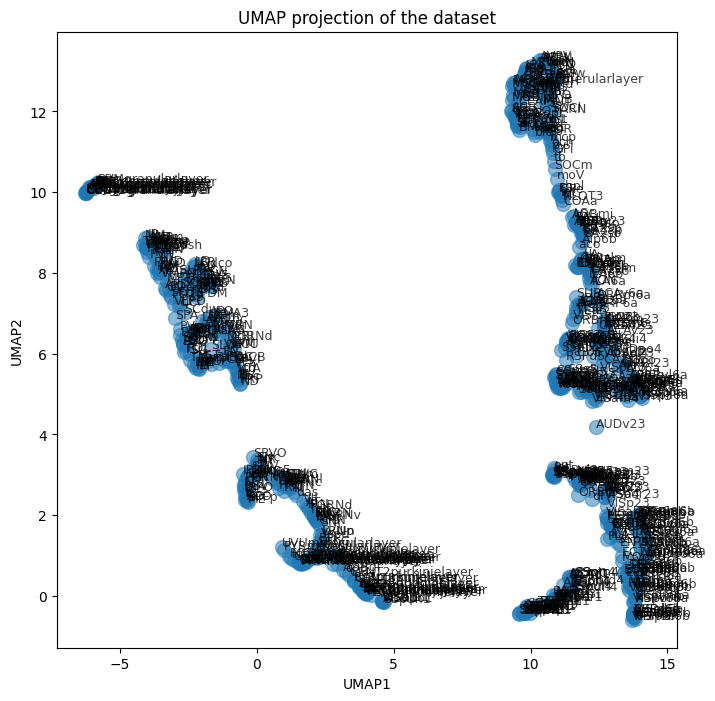

In [21]:
plot_umap(np.log10(e_types_densities + 1.))

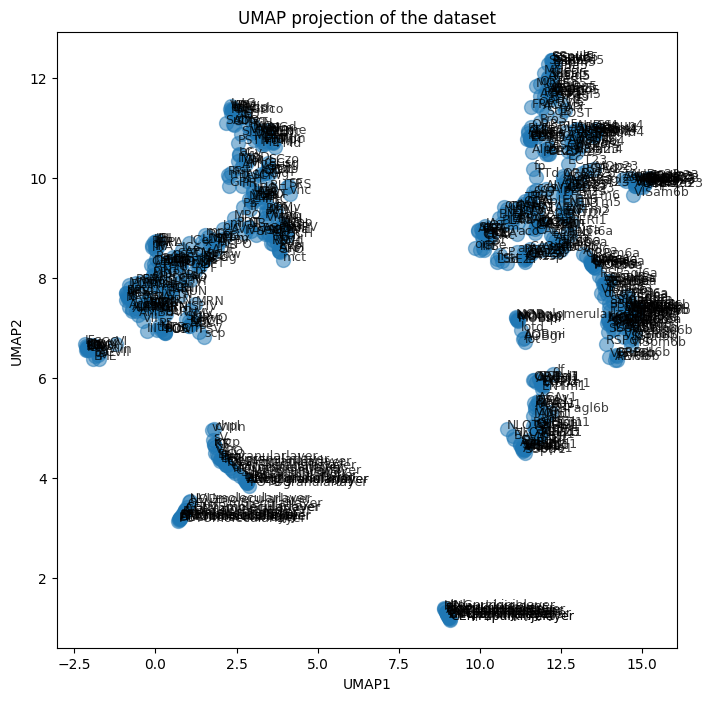

In [22]:
plot_umap(np.log10(m_types_densities + 1.))

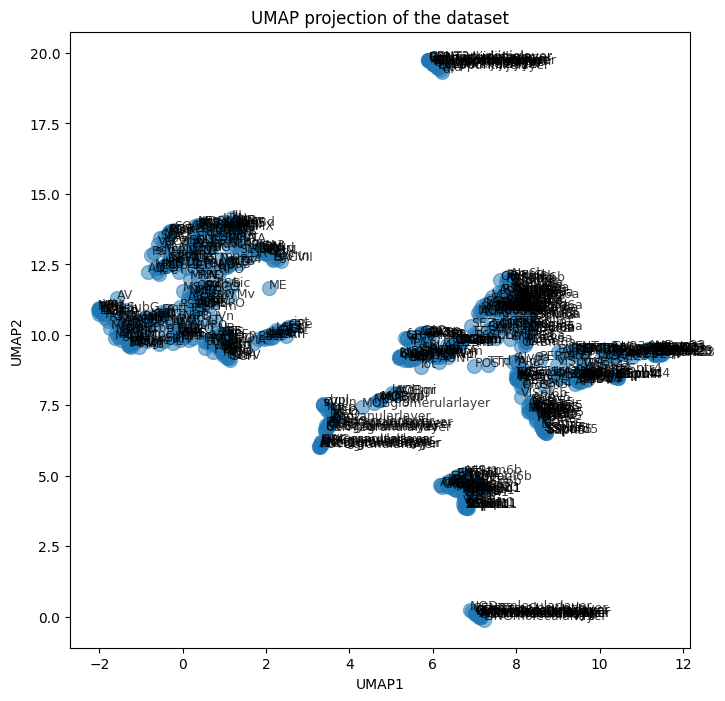

In [23]:
plot_umap(np.log10(me_types_densities + 1.))

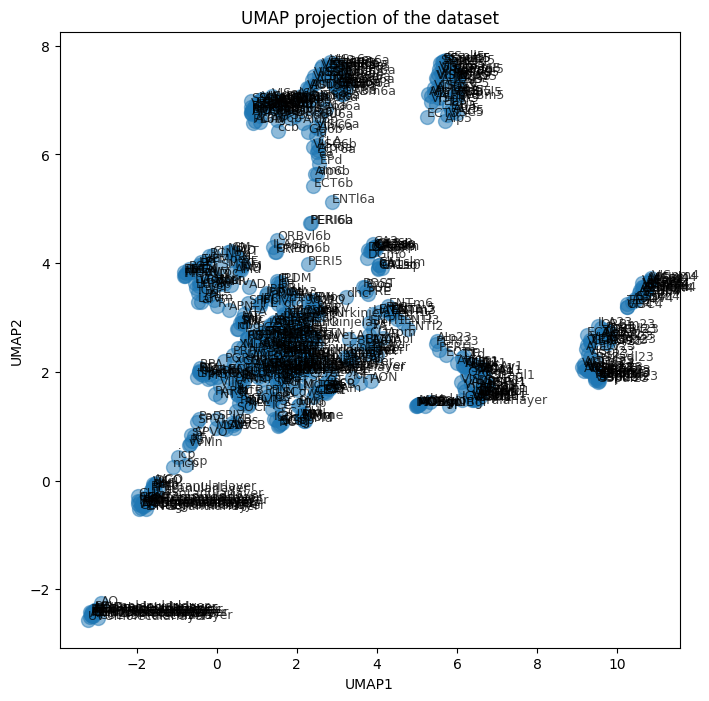

In [24]:
plot_umap(np.log10(t_types_densities + 1.))

In [25]:
import pandas as pd
import umap
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
import seaborn as sns

def plot_umap_and_clusters(df, max_clusters=10):
    """
    Plot a UMAP projection and perform clustering.
    Use the Elbow Method to determine the optimal number of clusters.
    Plot a dendrogram and a bar plot of e-type distribution within clusters.
    
    Parameters:
    df (pd.DataFrame): Input dataframe with sample names as the index and feature values as the values.
    max_clusters (int): Maximum number of clusters to test for the Elbow Method.
    """
    # Initialize UMAP model
    reducer = umap.UMAP()
    
    # Fit and transform the data
    embedding = reducer.fit_transform(df.values)
    
    # Determine the optimal number of clusters using the Elbow Method
    wcss = []
    for n in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=n, random_state=42)
        # kmeans.fit(embedding)
        kmeans.fit_predict(df.values)
        wcss.append(kmeans.inertia_)
    
    # Plot the Elbow Method graph
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_clusters + 1), wcss, marker='o')
    plt.title('Elbow Method for Optimal Number of Clusters')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()
    
    # Ask the user to input the optimal number of clusters based on the Elbow plot
    optimal_clusters = int(input("Enter the optimal number of clusters based on the Elbow plot: "))
    
    # Perform K-Means clustering with the selected number of clusters
    kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
    # df['cluster'] = kmeans.fit_predict(embedding)
    df['cluster'] = kmeans.fit_predict(df.values)
    
    # Plot UMAP projection with cluster labels
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=df['cluster'], cmap='viridis', s=100, alpha=0.5)
    plt.title('UMAP projection with K-Means clusters')
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.legend(*scatter.legend_elements(), title="Clusters")
    
    for i, sample_name in enumerate(df.index):
        plt.annotate(sample_name, (embedding[i, 0], embedding[i, 1]), fontsize=9, alpha=0.75)
    plt.show()

    try:
        # Hierarchical Clustering and Dendrogram
        Z = linkage(df.drop('cluster', axis=1), method='ward')
        plt.figure(figsize=(30, 8))
        dendrogram(Z, labels=df.index, leaf_rotation=90, leaf_font_size=8, color_threshold=0)
        plt.title('Hierarchical Clustering Dendrogram')
        plt.xlabel('Sample Index')
        plt.ylabel('Distance')
        plt.show()
    except:
        print("HCA error")
    try:
        # Bar plot of e-type distribution within clusters
        cluster_counts = df.groupby('cluster').size()
        e_type_distribution = df.groupby(['cluster'])[df.columns[:-1]].sum()
        # e_type_distribution_percent = e_type_distribution.div(cluster_counts, axis=0) * 100
        e_type_distribution_percent = e_type_distribution.div(np.sum(e_type_distribution, axis=1), axis=0) * 100

    
        e_type_distribution_percent.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='jet')
        plt.title('Type Distribution within Clusters')
        plt.xlabel('Cluster')
        plt.ylabel('Percentage')
        plt.legend(title='Type', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()
    except:
        print("bar plot error")

    return df

def compute_t_clusters(df, max_clusters=10):
    """
    Plot a UMAP projection and perform clustering.
    Use the Elbow Method to determine the optimal number of clusters.
    Plot a dendrogram and a bar plot of e-type distribution within clusters.
    
    Parameters:
    df (pd.DataFrame): Input dataframe with sample names as the index and feature values as the values.
    max_clusters (int): Maximum number of clusters to test for the Elbow Method.
    """
    # Initialize UMAP model
    reducer = umap.UMAP()
    
    # Fit and transform the data
    embedding = reducer.fit_transform(df.values)
    
    # Determine the optimal number of clusters using the Elbow Method
    wcss = []
    for n in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=n, random_state=42)
        # kmeans.fit(embedding)
        kmeans.fit_predict(df.values)
        wcss.append(kmeans.inertia_)
    
    # Plot the Elbow Method graph
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_clusters + 1), wcss, marker='o')
    plt.title('Elbow Method for Optimal Number of Clusters')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()
    
    # Ask the user to input the optimal number of clusters based on the Elbow plot
    optimal_clusters = int(input("Enter the optimal number of clusters based on the Elbow plot: "))
    
    # Perform K-Means clustering with the selected number of clusters
    kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
    # df['cluster'] = kmeans.fit_predict(embedding)
    df['cluster'] = kmeans.fit_predict(df.values)

    return df

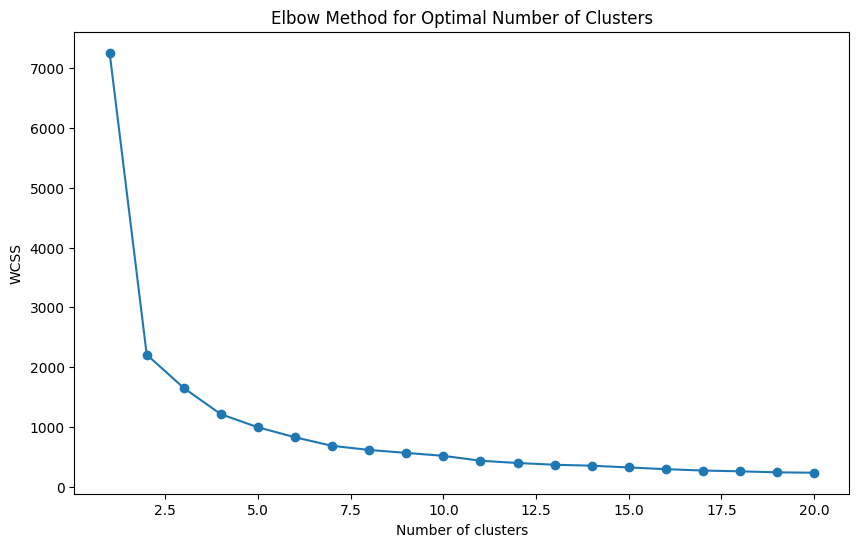

Enter the optimal number of clusters based on the Elbow plot:  3


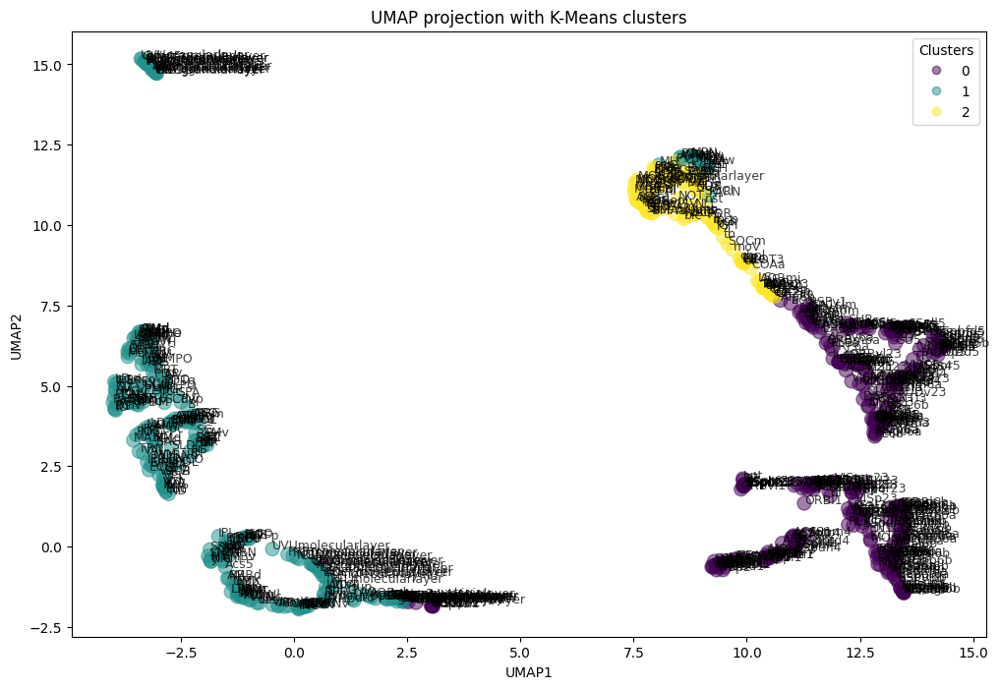

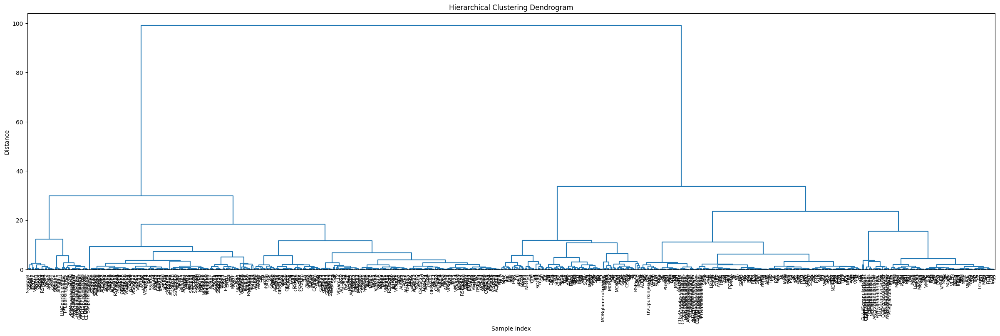

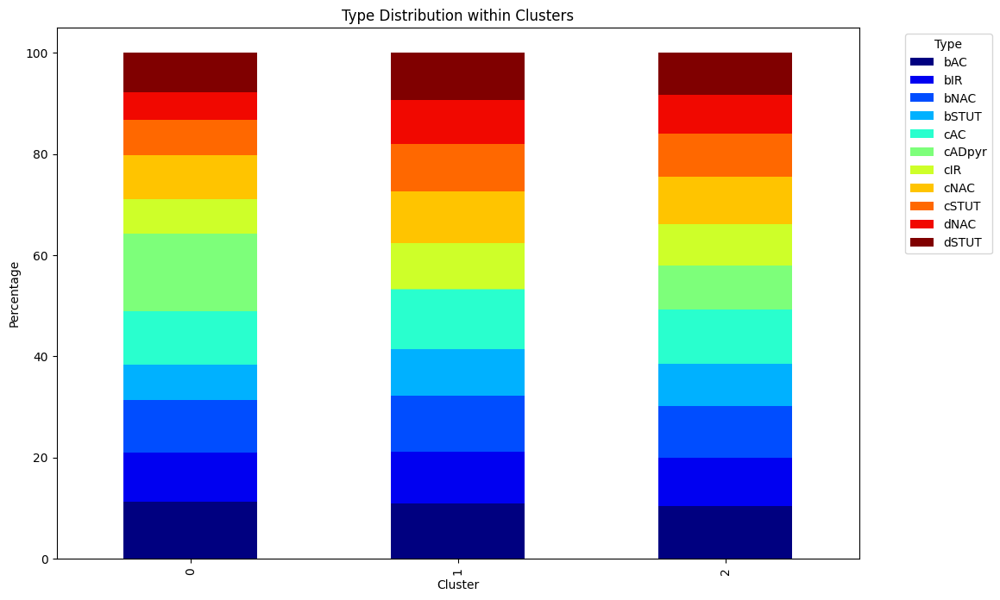

In [26]:
e_types_densities_clusters = plot_umap_and_clusters(np.log10(e_types_densities + 1.), max_clusters=20)

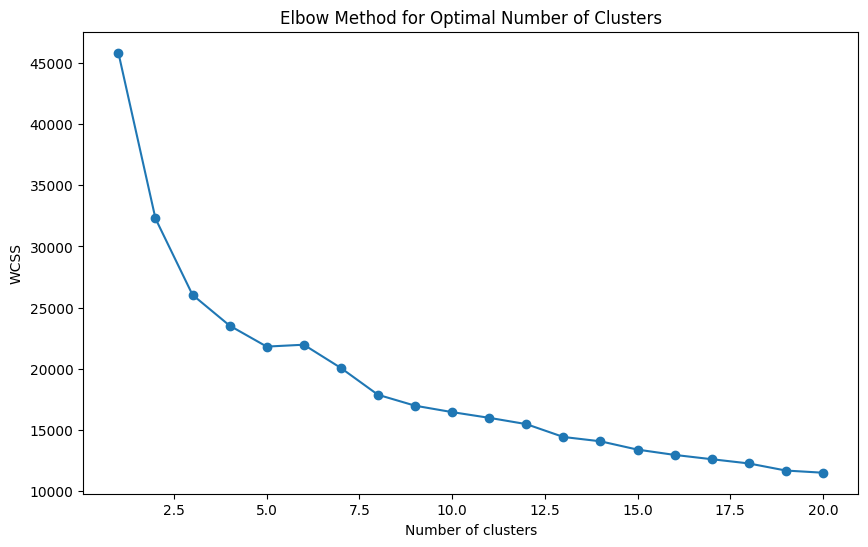

Enter the optimal number of clusters based on the Elbow plot:  4


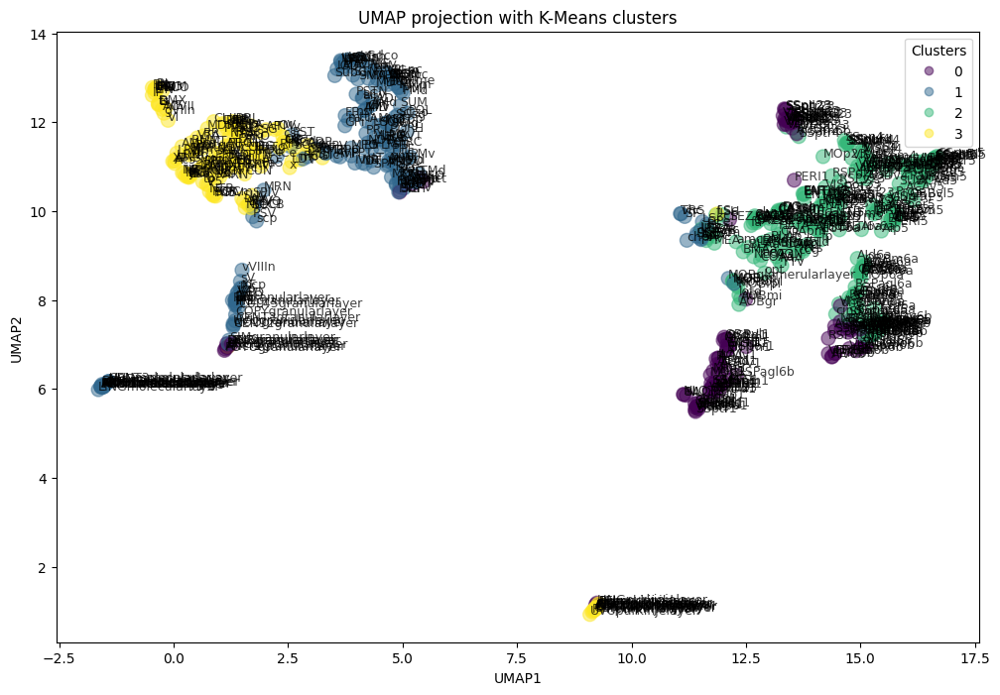

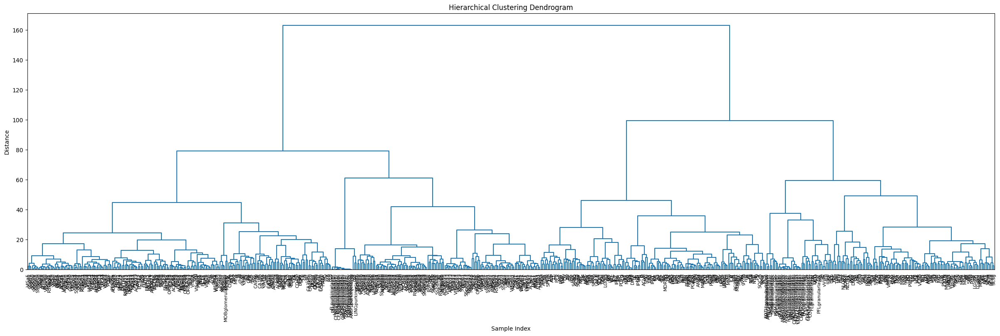

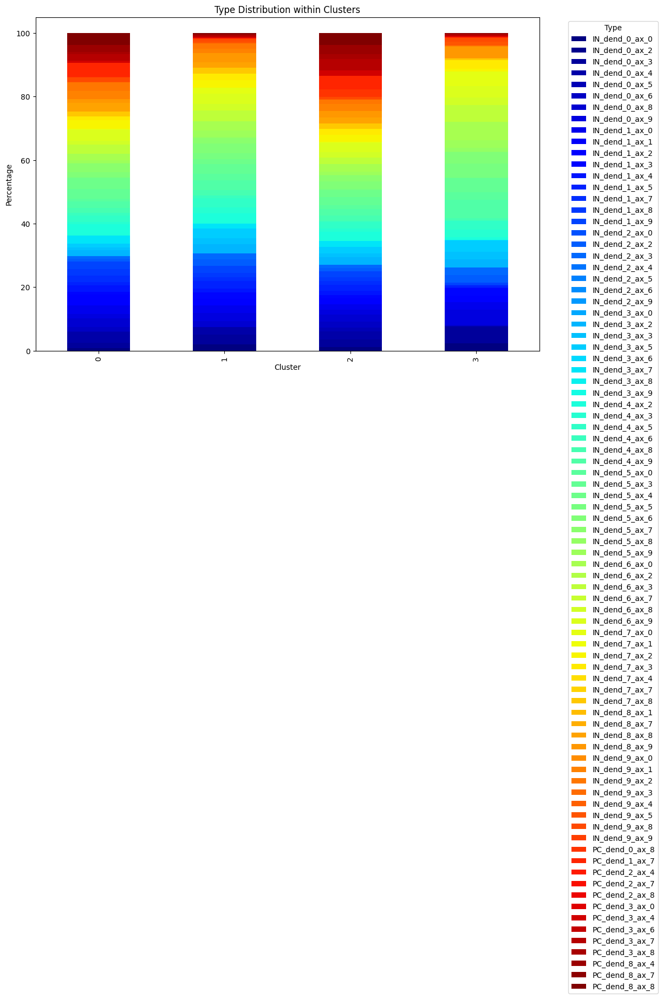

In [27]:
m_types_densities_clusters = plot_umap_and_clusters(np.log10(m_types_densities + 1.), max_clusters=20)

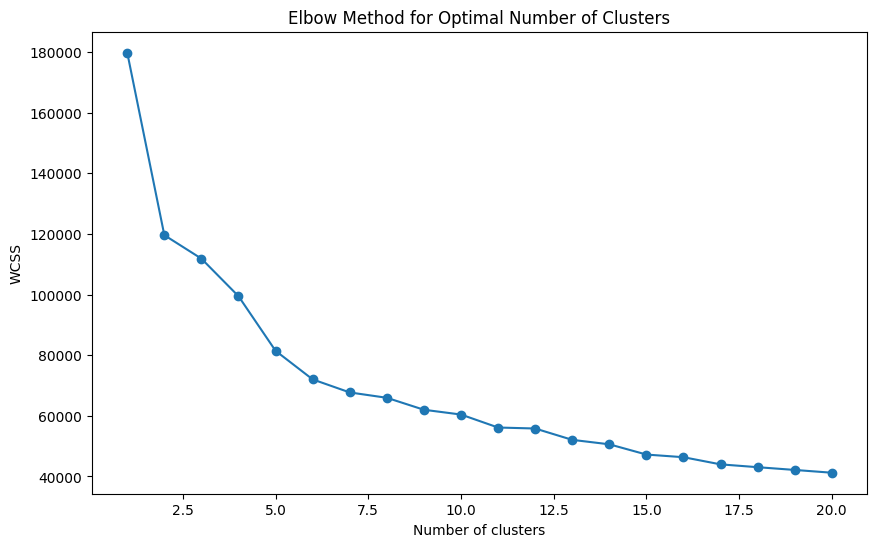

Enter the optimal number of clusters based on the Elbow plot:  6


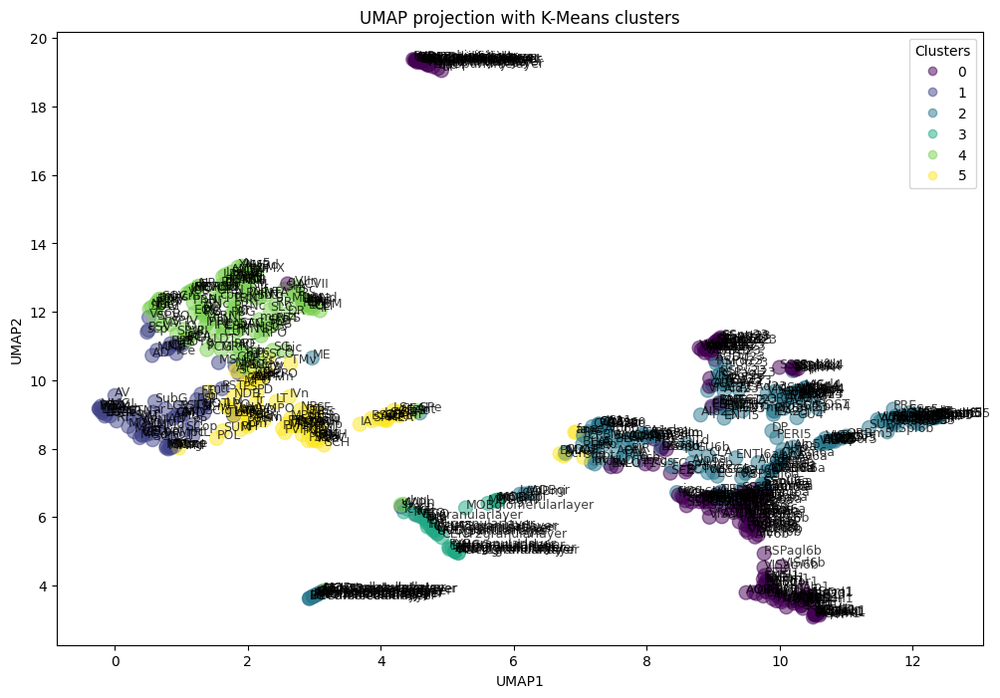

/var/folders/mt/7f938cq120v6pjmztk2lb650l8xs4d/T/ipykernel_13038/2504062596.py:62: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  Z = linkage(df.drop('cluster', axis=1), method='ward')


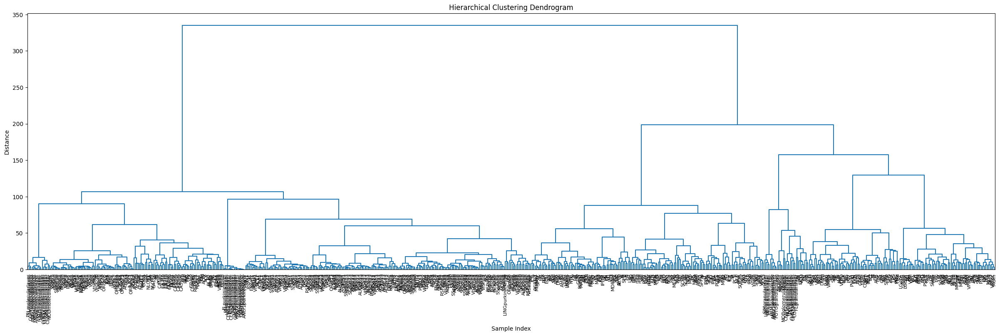

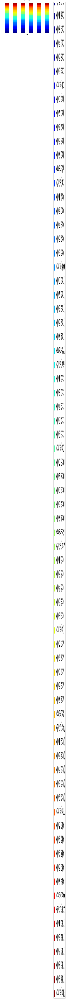

In [28]:
me_types_densities_clusters = plot_umap_and_clusters(np.log10(me_types_densities + 1.), max_clusters=20)

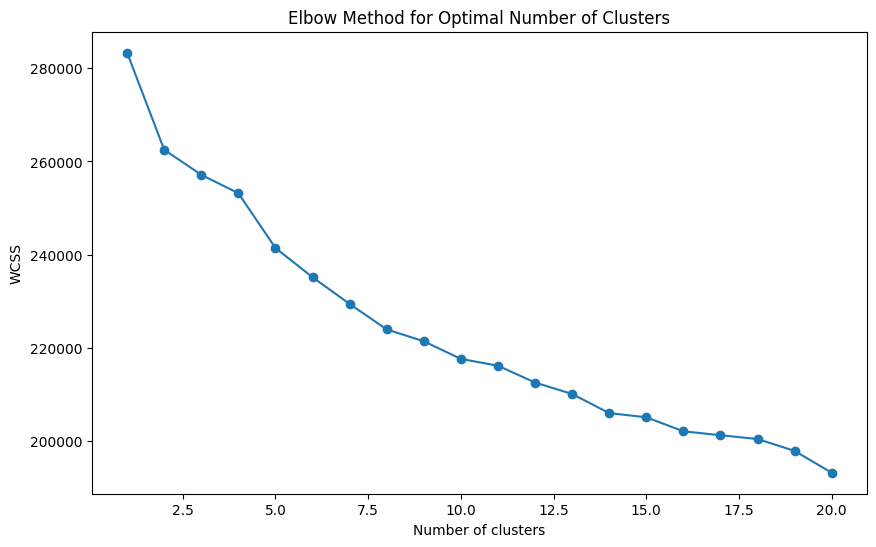

Enter the optimal number of clusters based on the Elbow plot:  6


In [29]:
t_types_densities_clusters = compute_t_clusters(np.log10(t_types_densities + 1.), max_clusters=20)

In [30]:
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import seaborn as sns

def detect_outliers(df, n_components=2):
    """
    Detect outliers in the dataframe using PCA and Isolation Forest.
    
    Parameters:
    df (pd.DataFrame): Input dataframe with brain regions as rows and cell types as columns.
    n_components (int): Number of principal components for PCA.
    
    Returns:
    pd.DataFrame: DataFrame with an additional 'outlier' column indicating outliers.
    """
    # Perform PCA to reduce dimensionality
    pca = PCA(n_components=n_components)
    pca_components = pca.fit_transform(df.values)
    
    # Use Isolation Forest to detect outliers
    iso_forest = IsolationForest(contamination=0.05, random_state=42)
    df['outlier'] = iso_forest.fit_predict(pca_components)
    
    return df

In [31]:
def detect_outliers_zscore(df, threshold=3):
    """
    Detect outliers in the dataframe using Z-Score method.
    
    Parameters:
    df (pd.DataFrame): Input dataframe with numerical values.
    threshold (float): Z-Score threshold to identify outliers.
    
    Returns:
    pd.DataFrame: DataFrame with an additional 'outlier' column indicating outliers.
    """
    
    z_scores = np.abs((df.drop('cluster', axis=1) - df.drop('cluster', axis=1).mean()) / df.drop('cluster', axis=1).std())
    df['outlier'] = (z_scores > threshold).any(axis=1)
    
    return df

In [32]:
me_types_densities.index[detect_outliers(me_types_densities)["outlier"] == -1]

Index(['FRP6a', 'GU6b', 'ORBl6b', 'ee', 'ILA6a', 'PL6a', 'ACAv6a', 'ORBm6a',
       'ORBvl6a', 'ORBm6b', 'MOBglomerularlayer', 'MOBgr', 'CA1sp', 'CA2sp',
       'CA3so', 'CENT2granularlayer', 'CUL45granularlayer',
       'CENT3granularlayer', 'SIMgranularlayer', 'arb', 'FN',
       'ANcr1granularlayer', 'COPYgranularlayer', 'FLgranularlayer', 'DN',
       'NODgranularlayer', 'UVUgranularlayer', 'PFLgranularlayer',
       'PRMgranularlayer', 'ANcr2granularlayer', 'DECgranularlayer',
       'FOTUgranularlayer', 'LINGgranularlayer', 'PYRgranularlayer'],
      dtype='object')

In [33]:
me_outliers = me_types_densities_clusters.index[detect_outliers(me_types_densities_clusters)["outlier"] == -1]
m_outliers = m_types_densities_clusters.index[detect_outliers(m_types_densities_clusters)["outlier"] == -1]
e_outliers = e_types_densities_clusters.index[detect_outliers(e_types_densities_clusters)["outlier"] == -1]
t_outliers = t_types_densities_clusters.index[detect_outliers(t_types_densities_clusters)["outlier"] == -1]

In [34]:
t_outliers

Index(['AId6a', 'AUDv5', 'GU4', 'GU6a', 'MOp6a', 'MOs6a', 'ORBl23', 'ORBl6a',
       'SSs5', 'SSs6a', 'SSs6b', 'TEa5', 'VISC6a', 'fa', 'AUDv4', 'TEa4',
       'MOp23', 'TEa23', 'VISli23', 'RSPd5', 'VISpl23', 'ACAv23', 'ACAv5',
       'ORBvl23', 'PL6a', 'ACAd6a', 'ACAv6a', 'ORBm6a', 'ACAd23', 'MOs23',
       'RSPagl23', 'RSPagl5', 'MRN', 'scp'],
      dtype='object')

In [35]:
m_types_densities_clusters

m-type,IN_dend_0_ax_0,IN_dend_0_ax_2,IN_dend_0_ax_3,IN_dend_0_ax_4,IN_dend_0_ax_5,IN_dend_0_ax_6,IN_dend_0_ax_8,IN_dend_0_ax_9,IN_dend_1_ax_0,IN_dend_1_ax_1,...,PC_dend_3_ax_0,PC_dend_3_ax_4,PC_dend_3_ax_6,PC_dend_3_ax_7,PC_dend_3_ax_8,PC_dend_8_ax_4,PC_dend_8_ax_7,PC_dend_8_ax_8,cluster,outlier
AId5,0.637257,0.0,2.463384,1.827866,1.508301,1.828315,1.783358,1.041906,1.206223,0.0,...,0.0,0.450304,0.0,3.857199,0.666585,1.667537,0.0,2.688372,2,1
AId6a,1.252966,0.0,2.106184,2.143184,1.499918,2.029698,1.678955,1.713608,1.536109,0.0,...,0.0,0.916591,0.0,3.506052,1.190478,3.067029,0.0,3.461617,2,1
AId6b,1.167000,0.0,1.601981,1.858916,0.000000,1.866776,1.714915,1.623950,2.142312,0.0,...,0.0,1.643295,0.0,3.852166,1.939360,3.407994,0.0,3.695977,2,1
AIp5,0.879891,0.0,2.247508,1.776448,1.137234,1.760308,1.579639,1.317052,1.270247,0.0,...,0.0,0.451444,0.0,3.769311,0.667969,2.759679,0.0,3.694817,2,1
AIp6a,1.096252,0.0,2.053617,2.205395,0.723533,1.775424,1.709468,1.549533,1.331052,0.0,...,0.0,2.368682,0.0,3.695572,2.668782,1.285737,0.0,3.695631,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ANcr1purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.576069,0.000000,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,3,-1
ANcr2purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.640581,0.000000,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,3,-1
CENT2purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.808115,0.000000,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,3,-1
CENT3purkinjelayer,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.728286,0.000000,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,3,-1


In [36]:
m_types_densities_clusters.index

Index(['AId5', 'AId6a', 'AId6b', 'AIp5', 'AIp6a', 'AIv23', 'AIv5', 'AIv6a',
       'AIv6b', 'AON',
       ...
       'NODpurkinjelayer', 'PFLpurkinjelayer', 'PRMpurkinjelayer',
       'PYRpurkinjelayer', 'UVUpurkinjelayer', 'ANcr1purkinjelayer',
       'ANcr2purkinjelayer', 'CENT2purkinjelayer', 'CENT3purkinjelayer',
       'SIMpurkinjelayer'],
      dtype='object', length=675)

In [37]:
e_types_densities_clusters.to_csv("Brain_regions_e_types_composition.csv")
m_types_densities_clusters.to_csv("Brain_regions_m_types_composition.csv")
me_types_densities_clusters.to_csv("Brain_regions_me_types_composition.csv")
t_types_densities_clusters.to_csv("Brain_regions_t_types_composition.csv")

In [38]:
e_no_t_outliers = []
m_no_t_outliers = []
me_no_t_outliers = []

for reg in e_outliers:
    if reg not in e_outliers.intersection(t_outliers):
        e_no_t_outliers.append(reg)
for reg in m_outliers:
    if reg not in m_outliers.intersection(t_outliers):
        m_no_t_outliers.append(reg)
for reg in me_outliers:
    if reg not in me_outliers.intersection(t_outliers):
        me_no_t_outliers.append(reg)

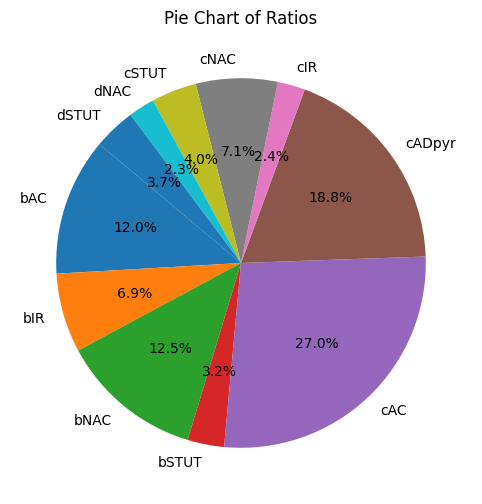

AIv6b


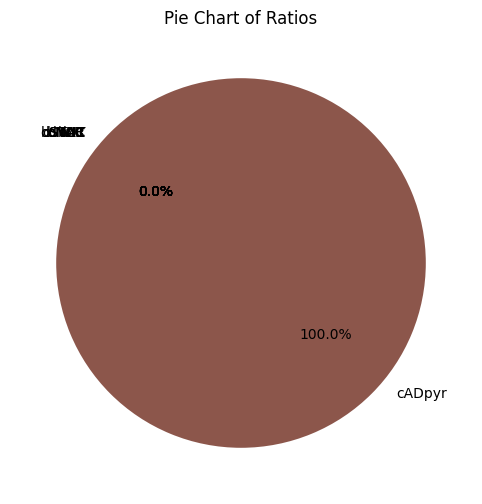

PERI6b


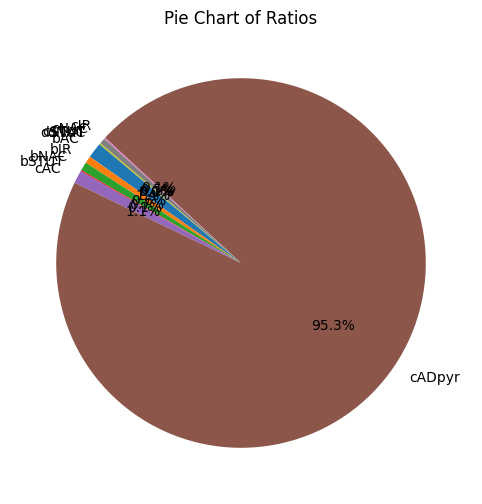

MEA


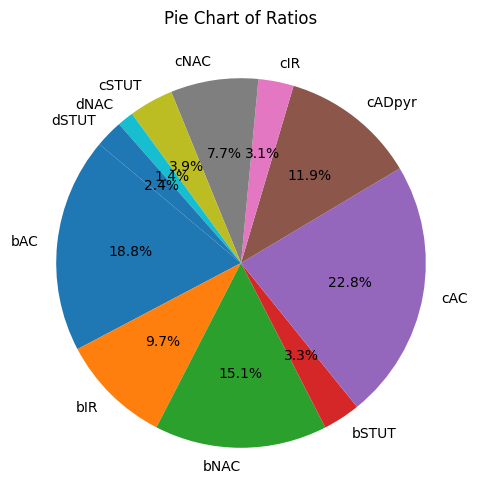

VISp1


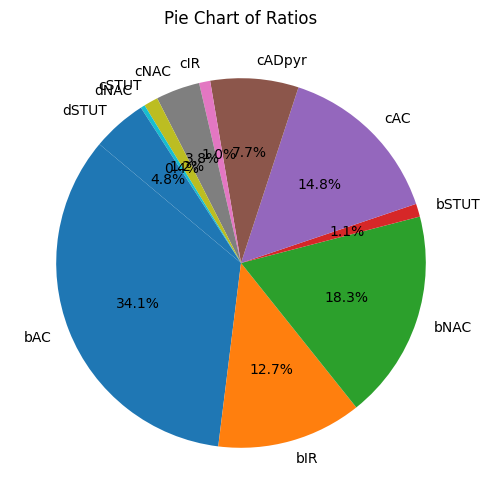

SSpbfd1


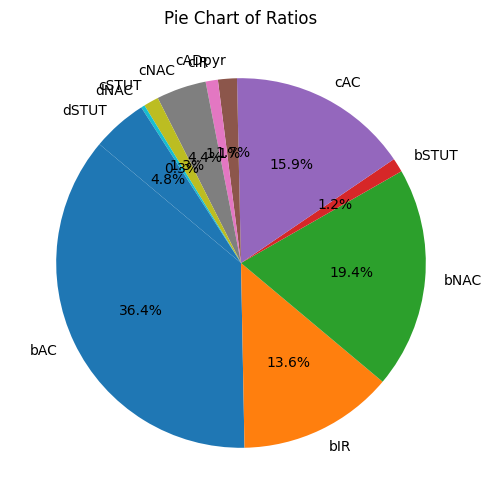

SSpn1


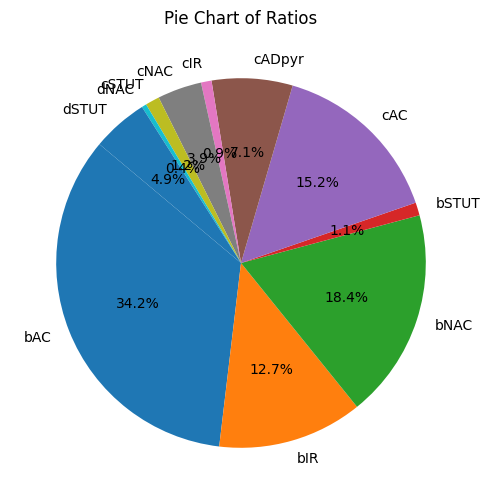

NLOT2


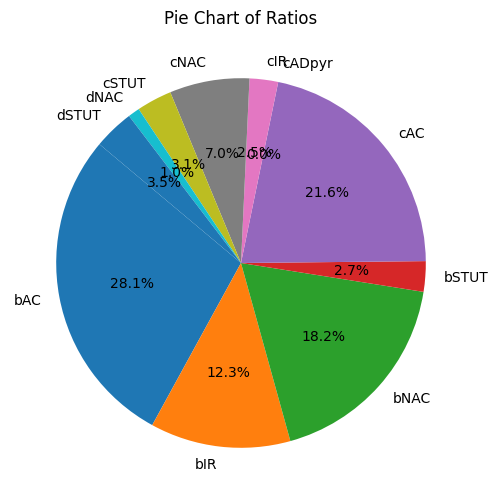

MOBglomerularlayer


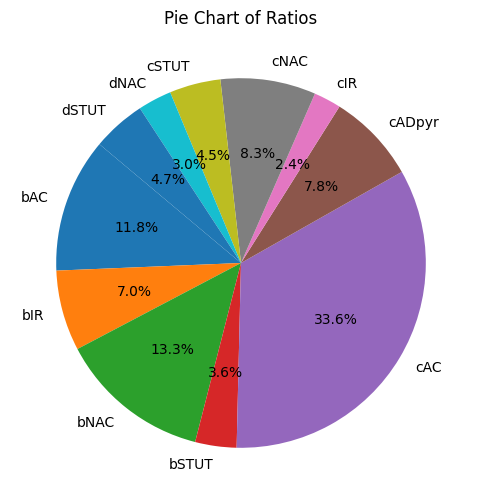

VISal1


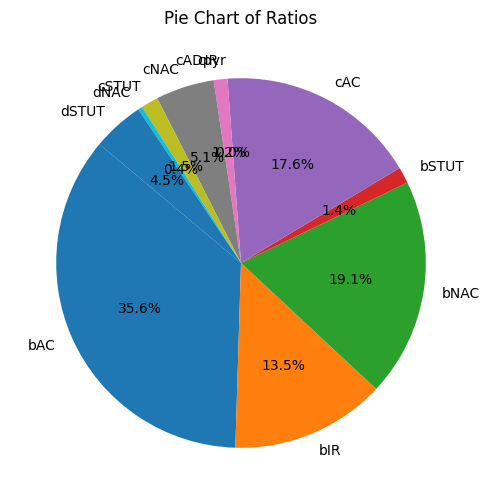

VISam1


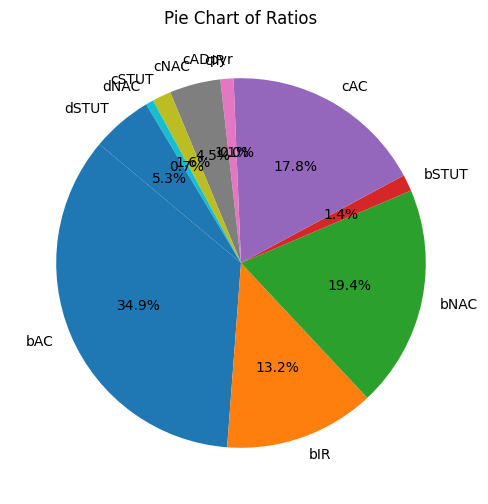

AUDd1


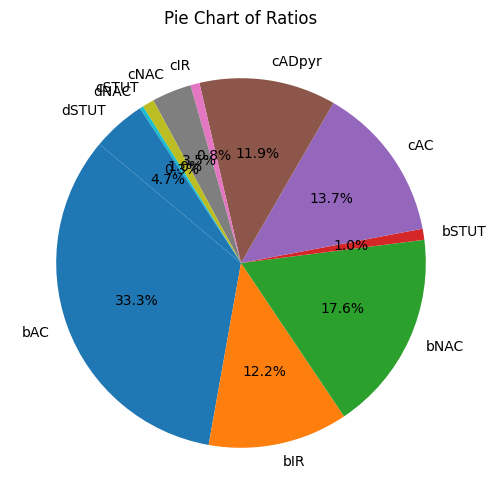

AUDpo1


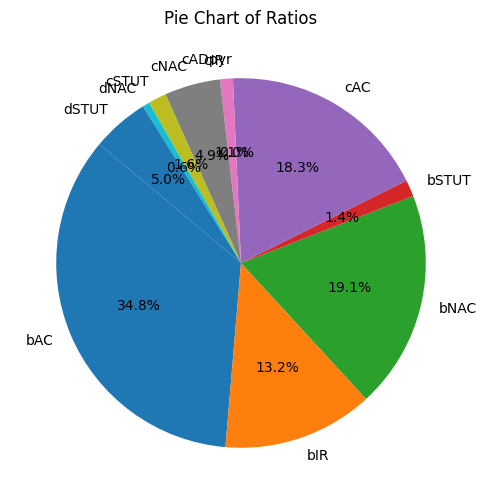

SSpll1


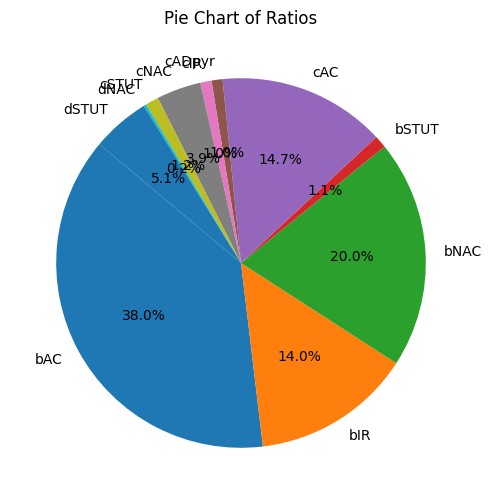

SSpul1


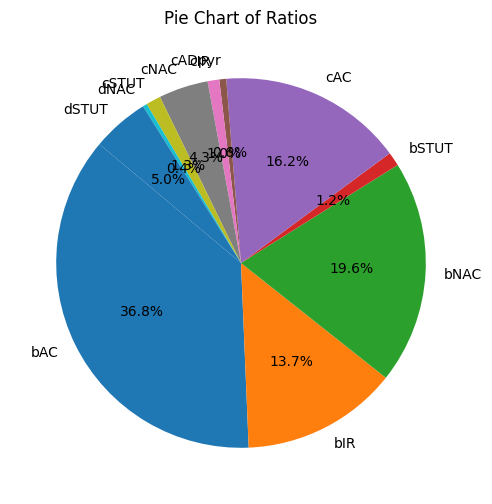

SSpun1


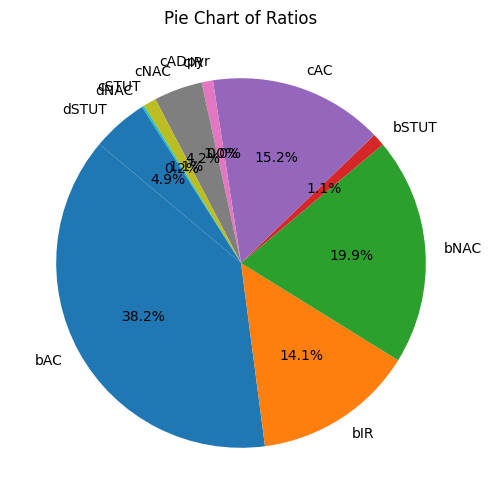

VISli1


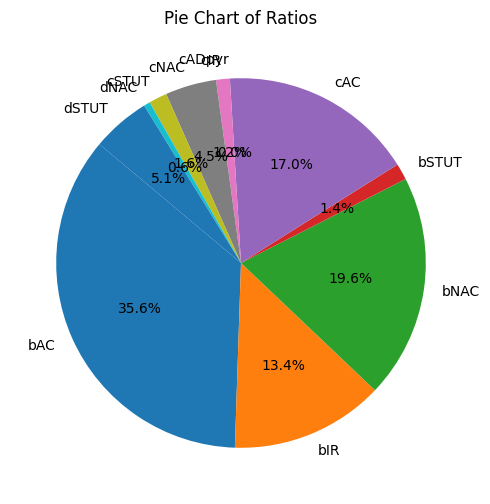

MOBmi


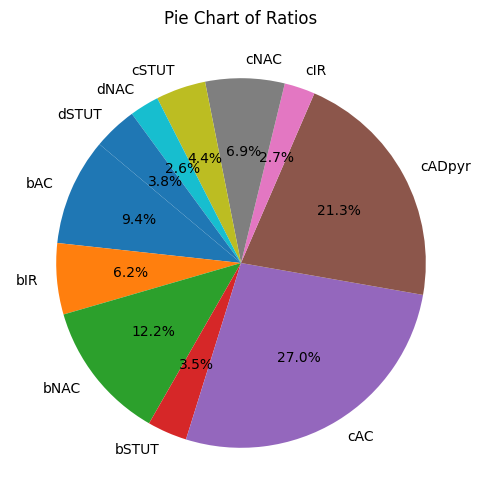

MOBgr


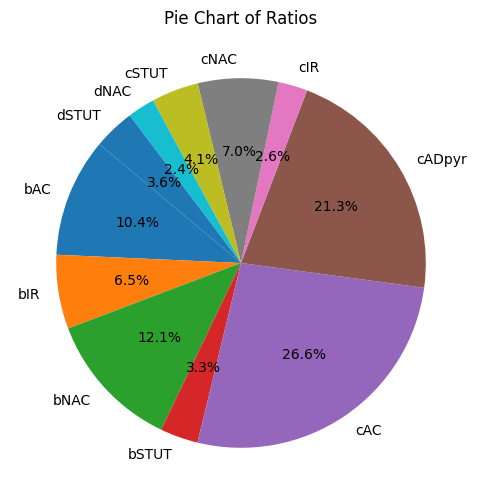

CA1sp


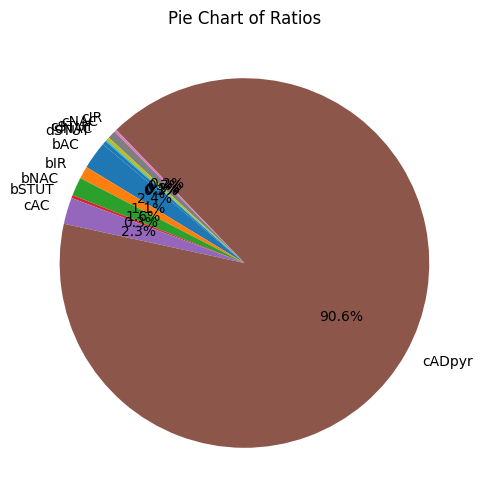

CA2sp


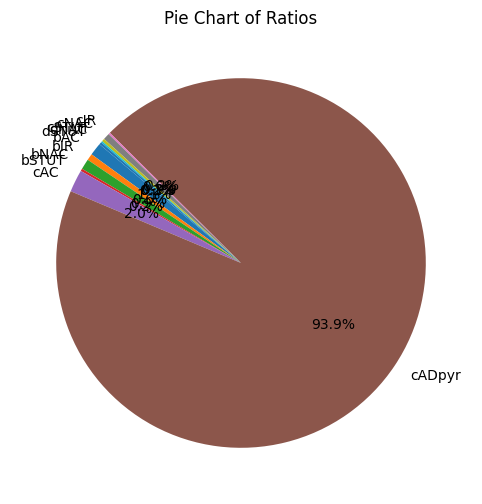

SH


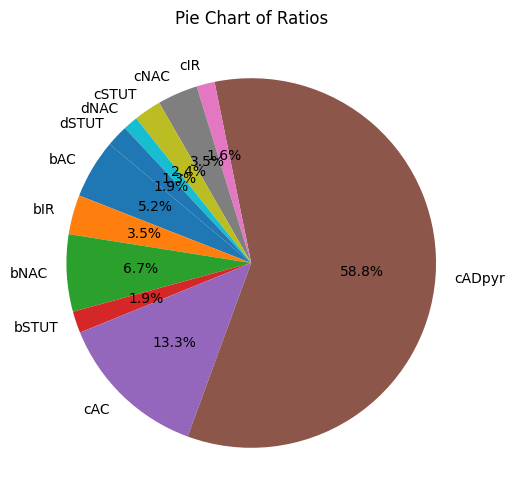

vhc


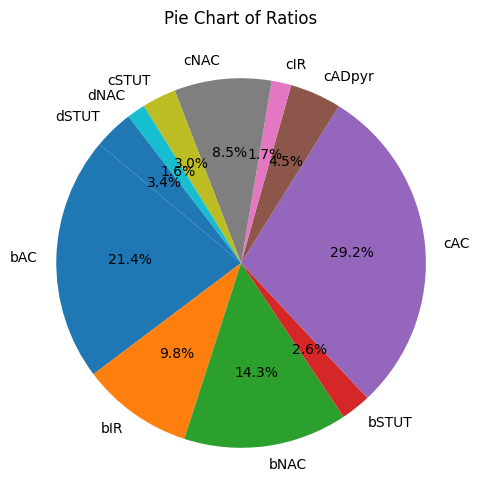

CENT2granularlayer


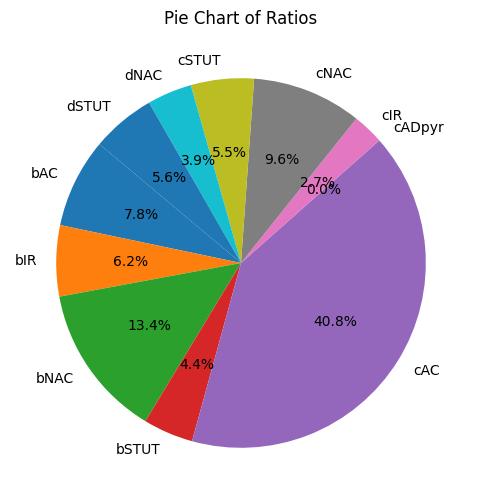

CUL45granularlayer


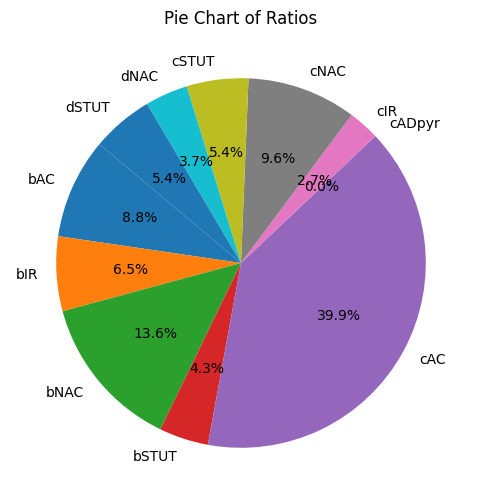

CENT3granularlayer


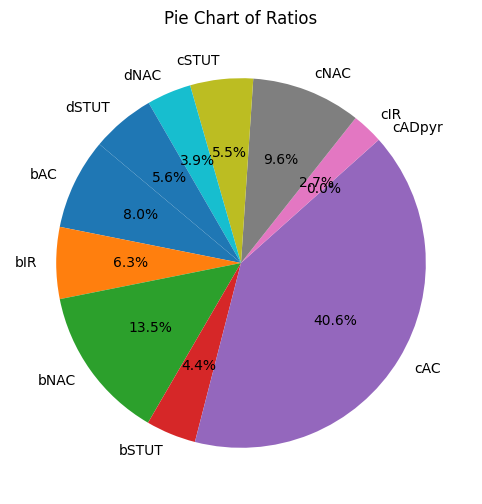

SIMgranularlayer


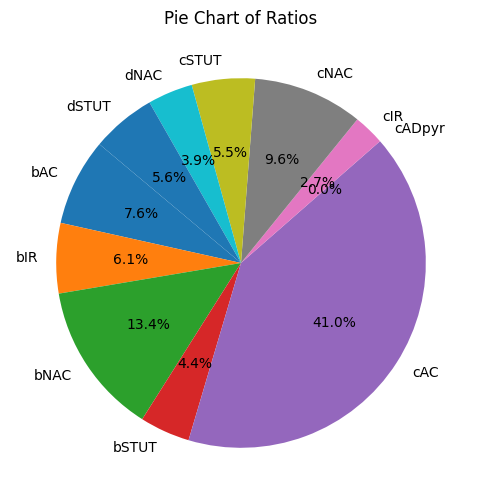

ANcr1granularlayer


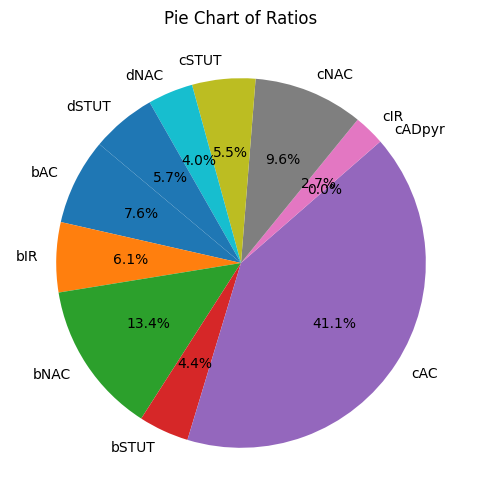

FLgranularlayer


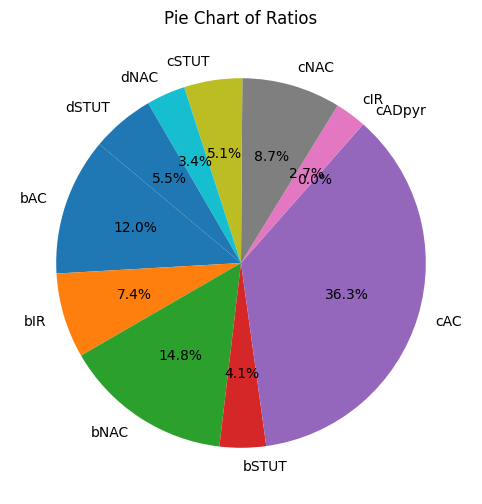

NODgranularlayer


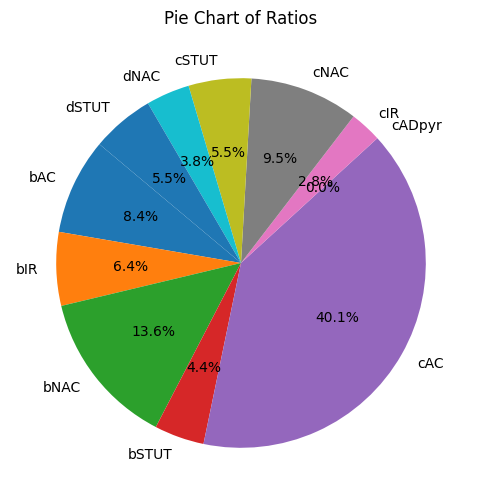

UVUgranularlayer


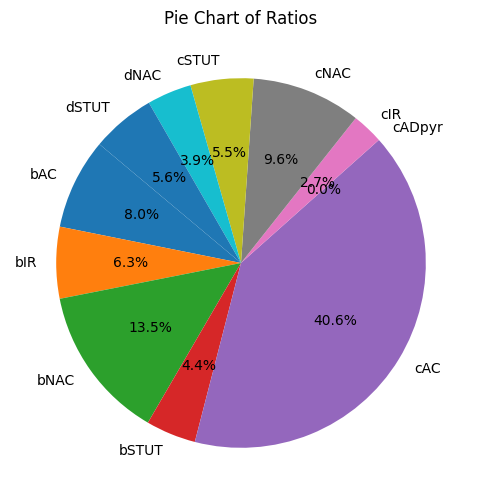

PYRgranularlayer


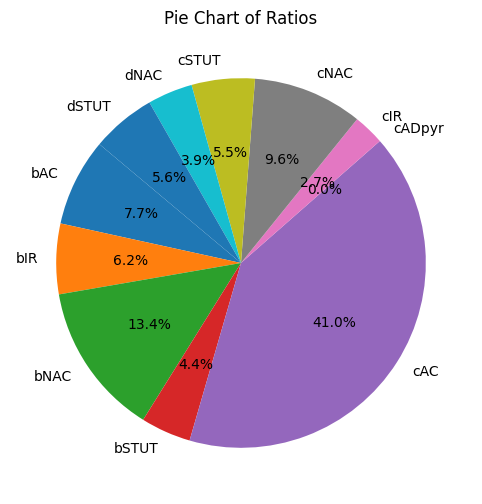

FLpurkinjelayer


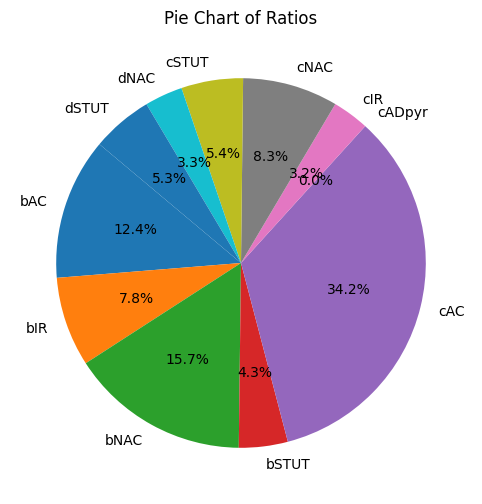

LINGpurkinjelayer


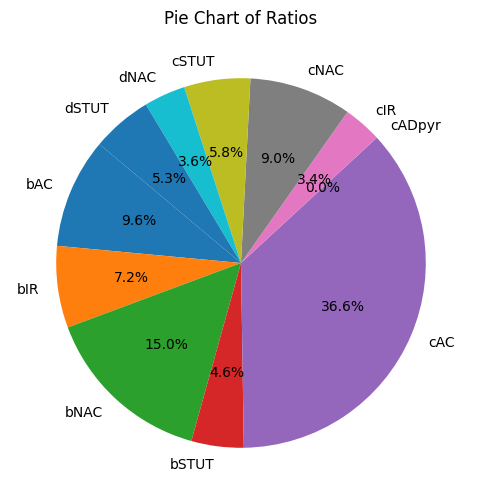

PFLpurkinjelayer


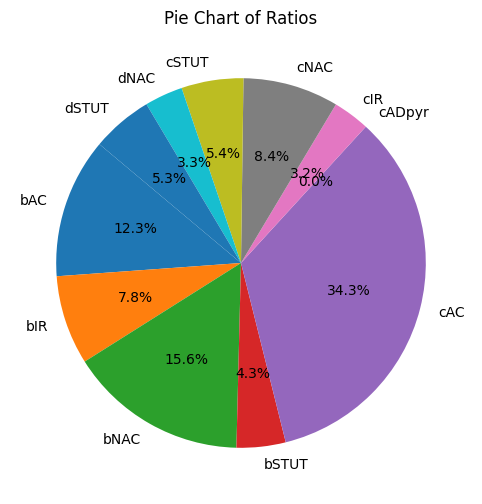

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

def create_pie_chart(df):
    # Extract labels and values from the DataFrame
    labels = df.index
    values = df.values
    
    # Create a pie chart
    plt.figure(figsize=(10, 6))
    plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=140)
    
    # Set the title of the pie chart
    plt.title('Pie Chart of Ratios')
    
    # Display the pie chart
    plt.show()

# Example DataFrame
e_dens_avg = np.mean(e_types_densities, axis=0)
data0 = e_dens_avg / np.sum(e_dens_avg)
# Create the pie chart
create_pie_chart(data0)

for reg in e_no_t_outliers:
    print(reg)
    data1 = e_types_densities.T[reg].T / np.sum(e_types_densities.T[reg].T)
    create_pie_chart(data1)


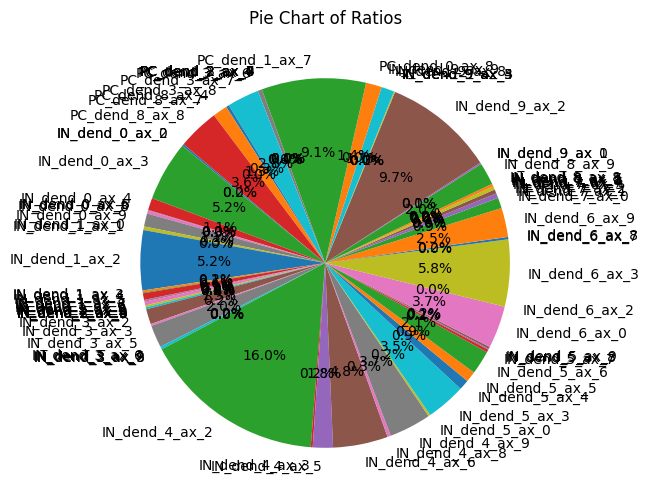

AIv6b


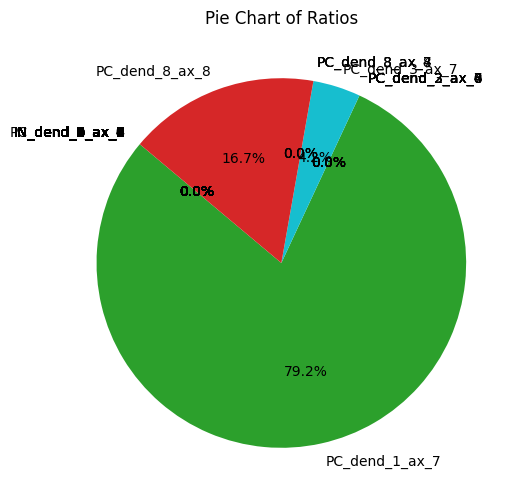

PERI6b


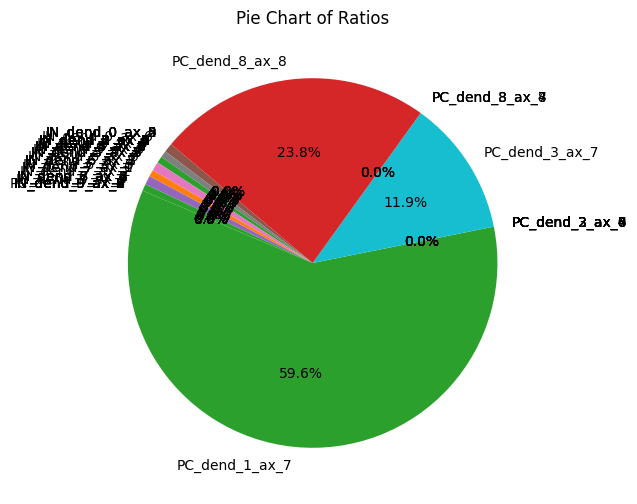

RSPv23


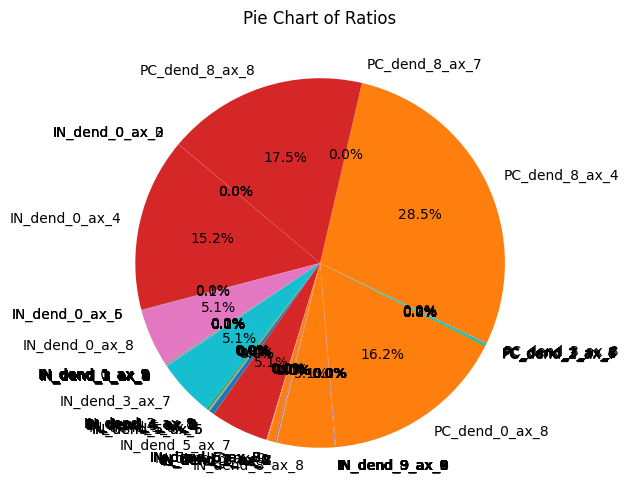

VISrl6b


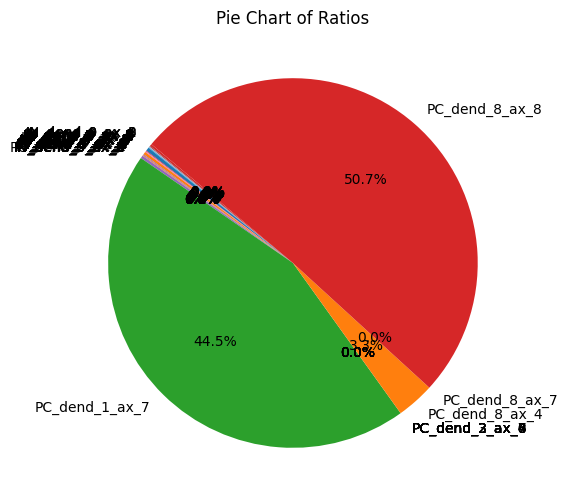

FRP6b


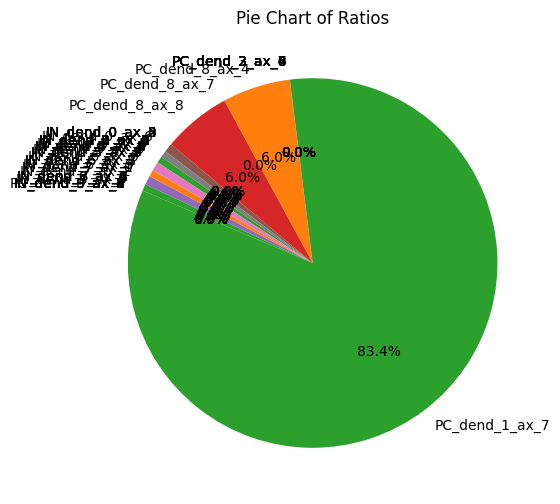

FRP23


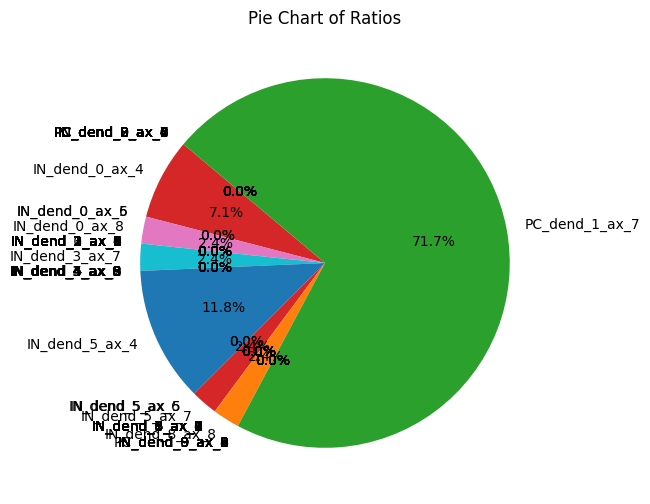

MOBglomerularlayer


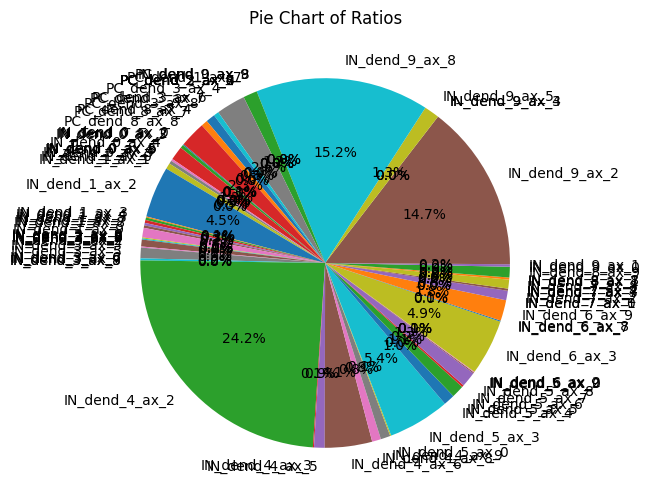

MOBgr


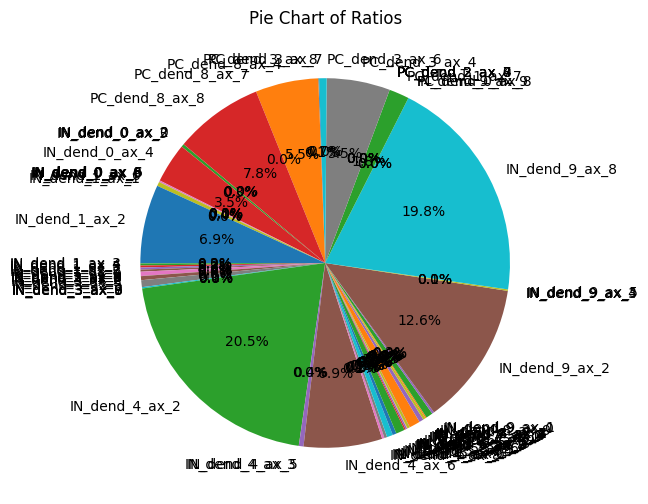

MH


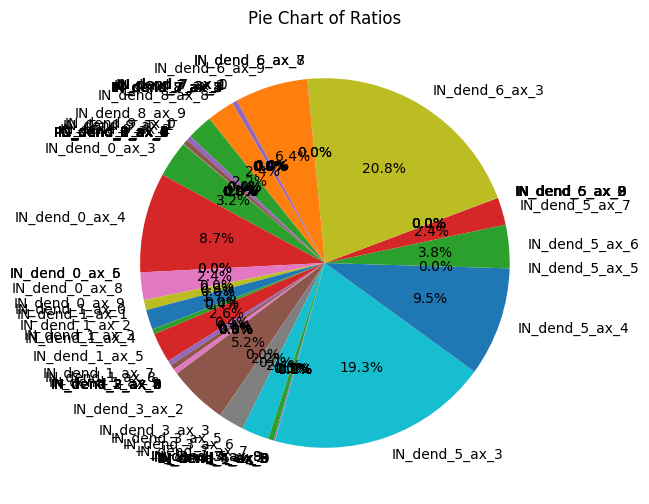

df


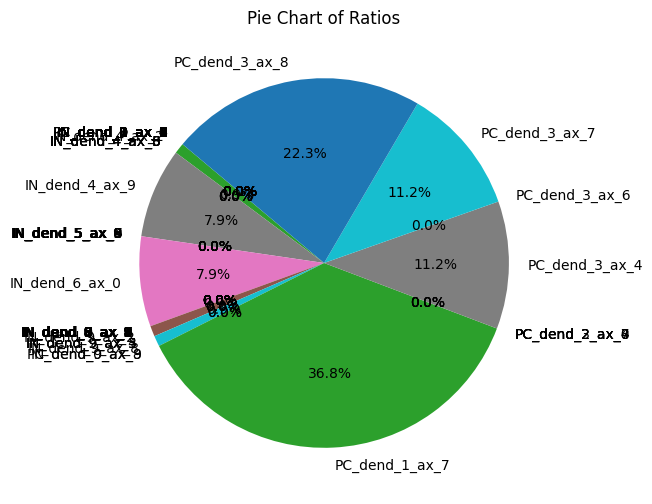

dtd


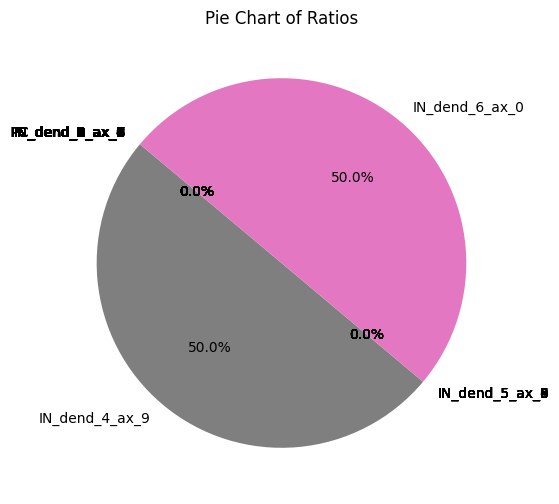

PDTg


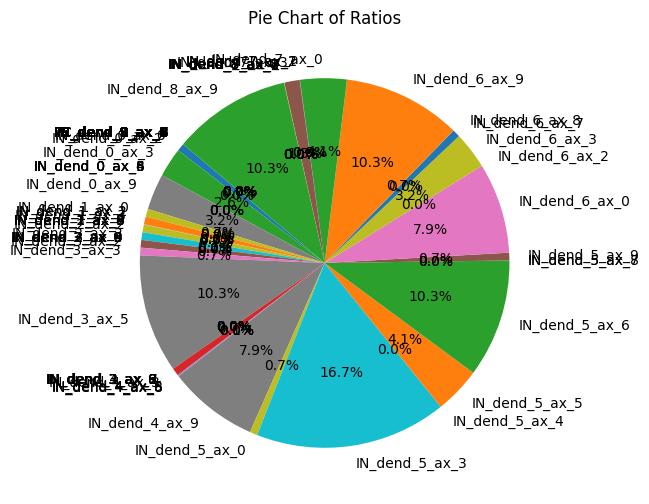

IPR


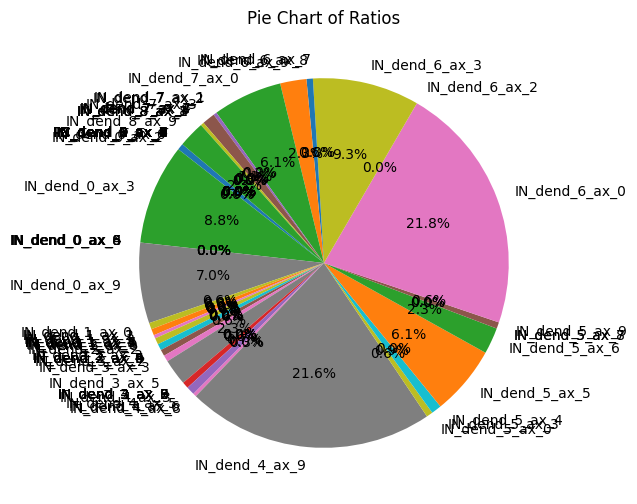

RPA


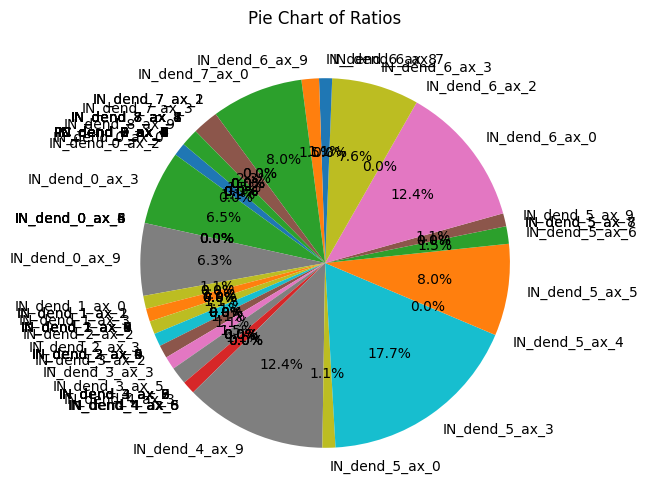

FLgranularlayer


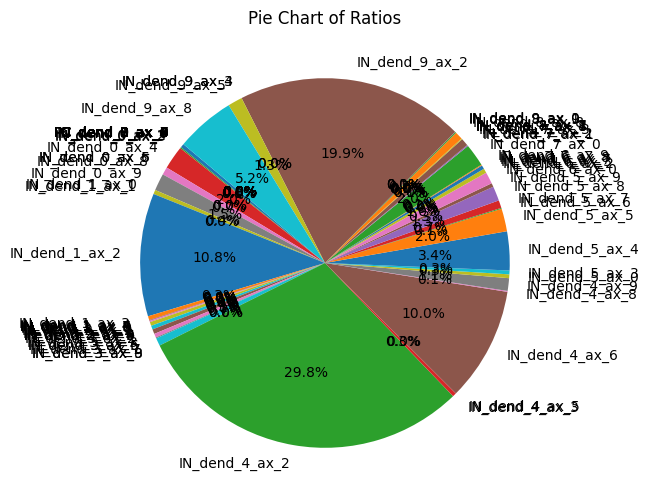

DN


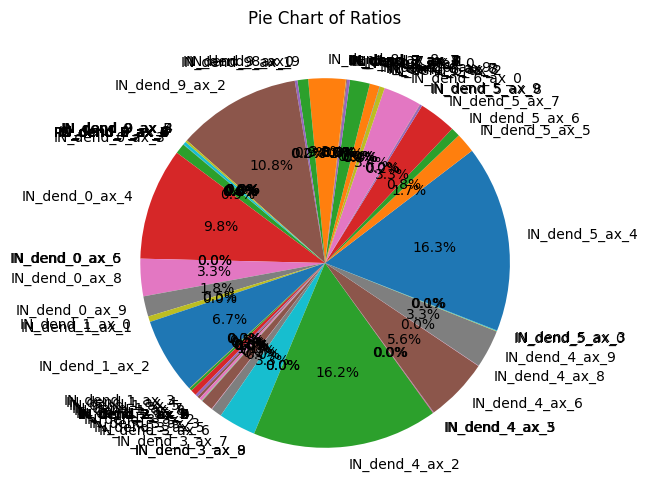

LRNp


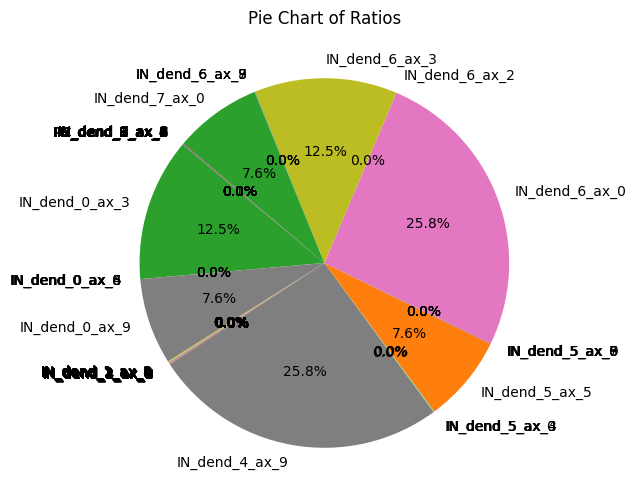

CU


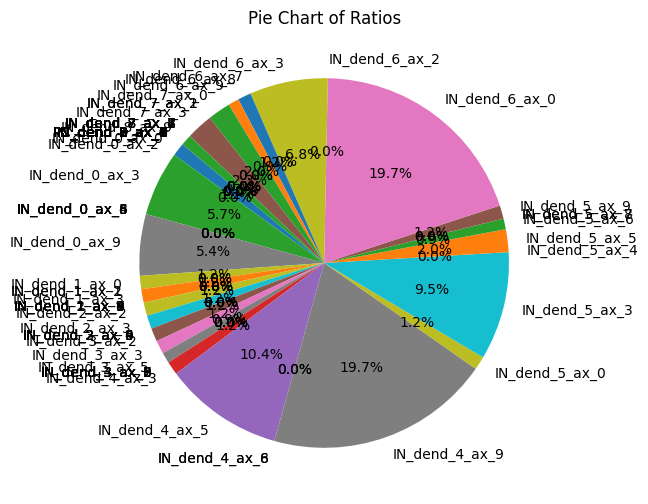

COPYpurkinjelayer


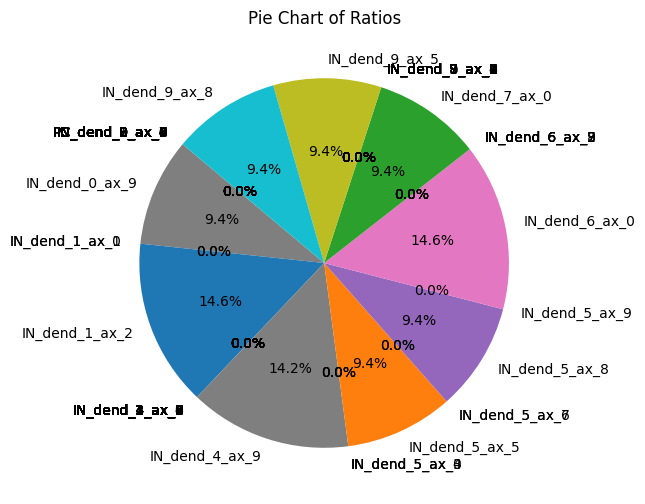

CUL45purkinjelayer


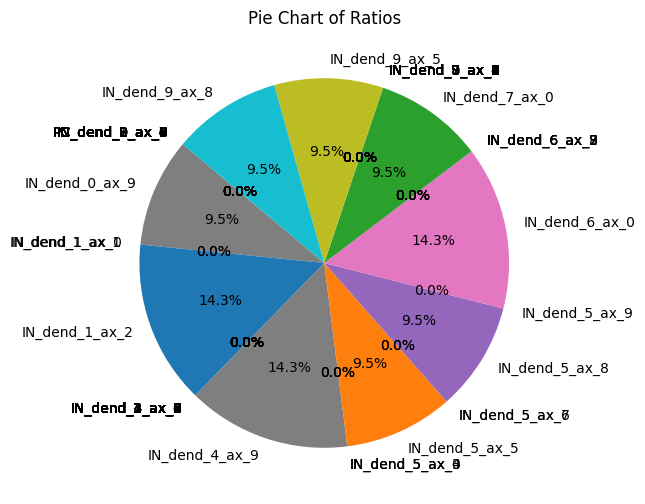

DECpurkinjelayer


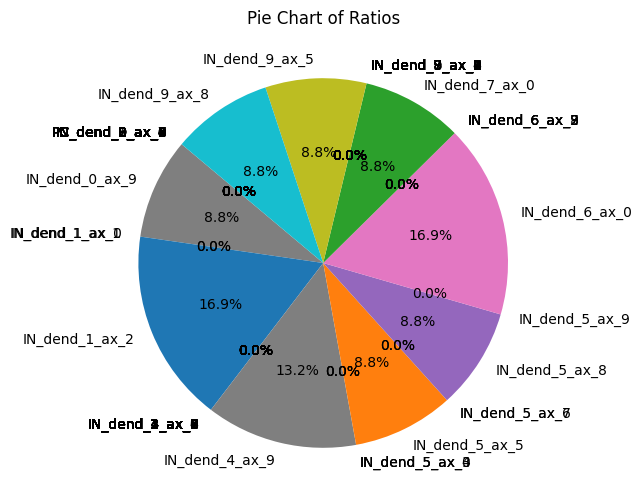

FLpurkinjelayer


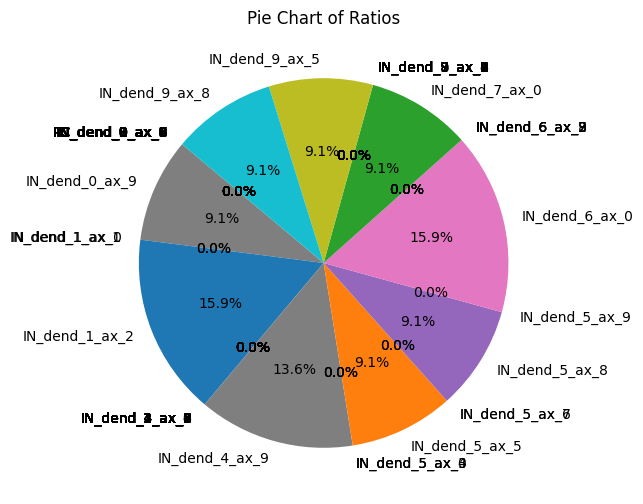

FOTUpurkinjelayer


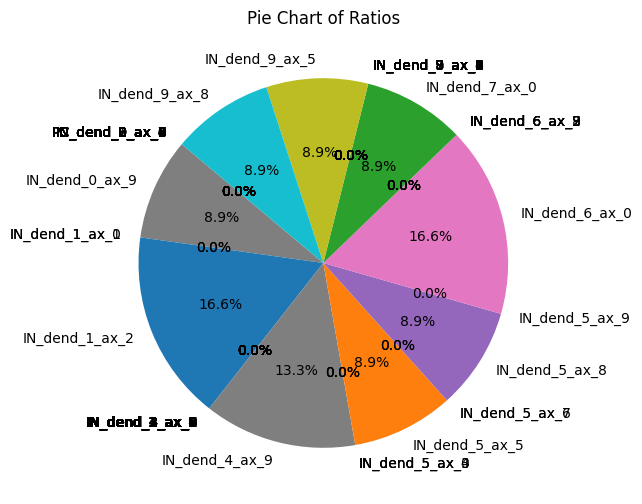

LINGpurkinjelayer


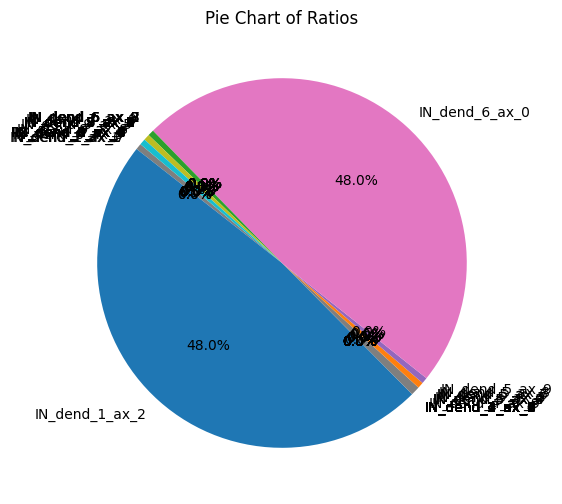

NODpurkinjelayer


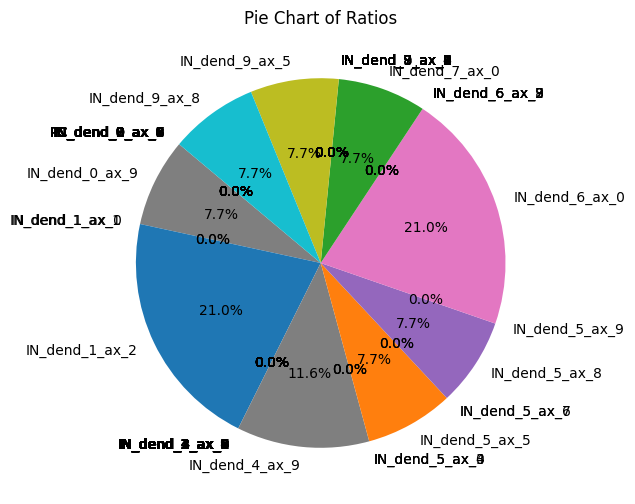

PFLpurkinjelayer


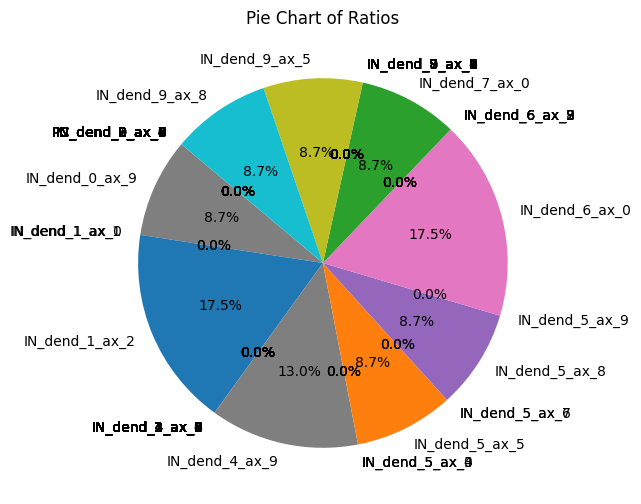

PRMpurkinjelayer


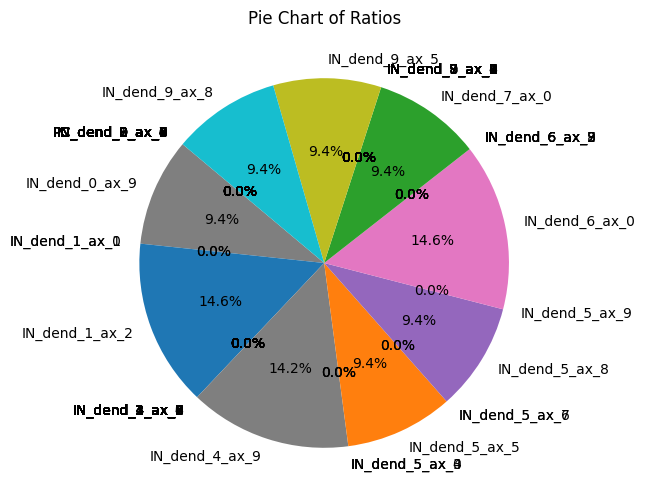

PYRpurkinjelayer


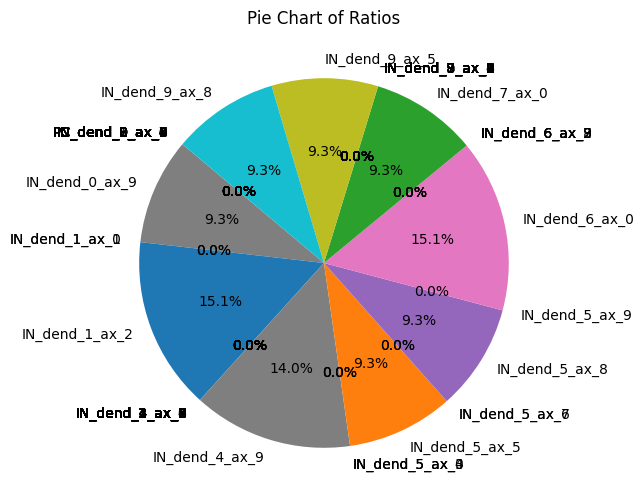

UVUpurkinjelayer


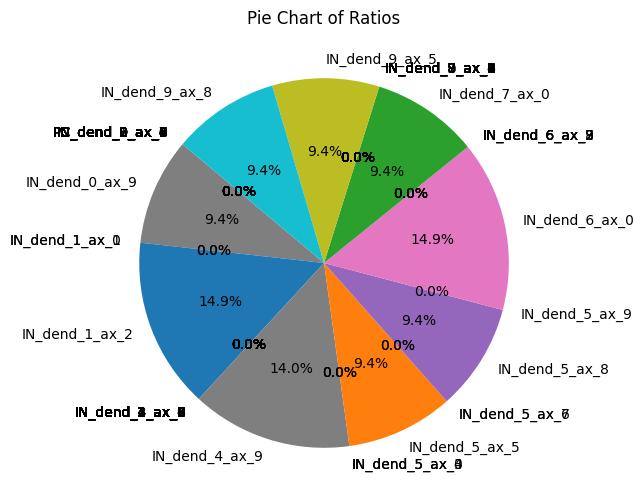

ANcr1purkinjelayer


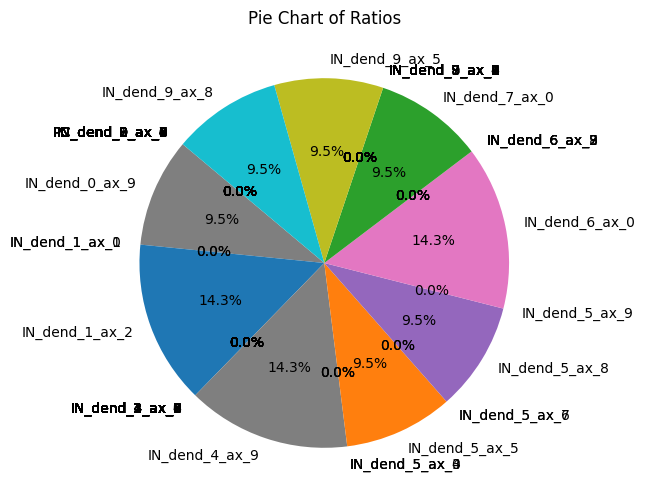

ANcr2purkinjelayer


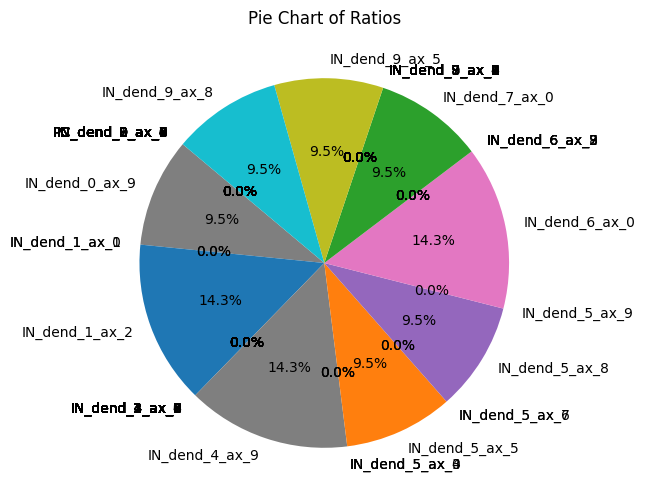

CENT2purkinjelayer


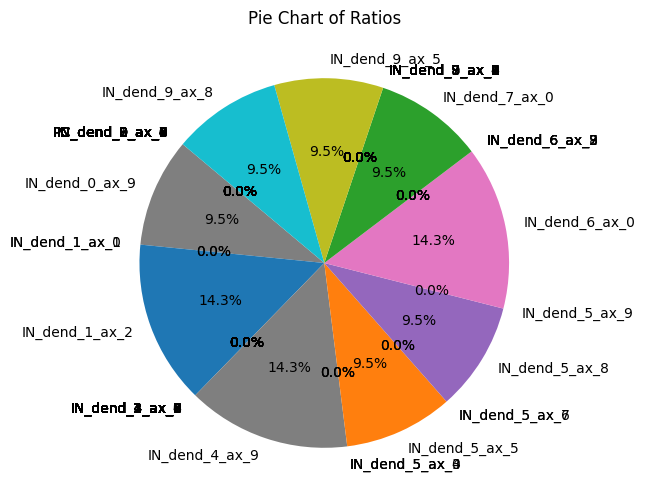

CENT3purkinjelayer


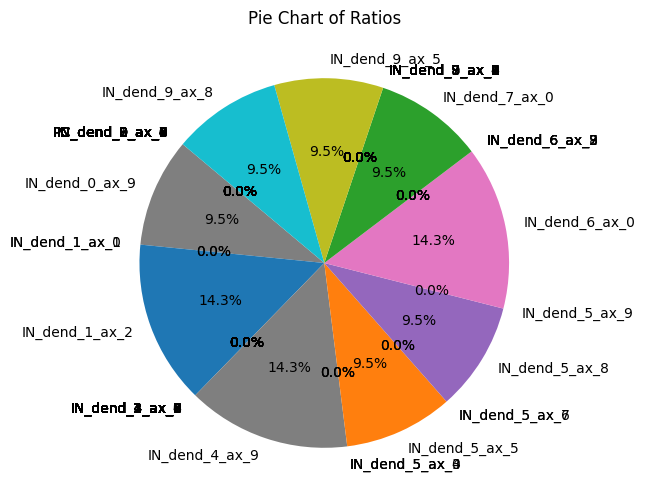

SIMpurkinjelayer


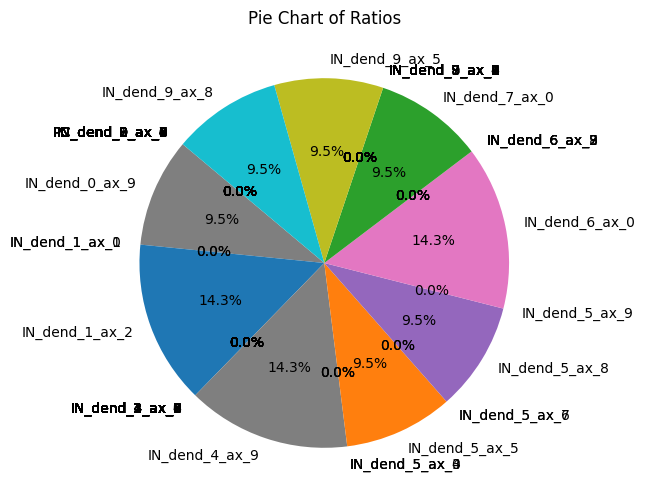

In [40]:
m_dens_avg = np.mean(m_types_densities, axis=0)
data_m = m_dens_avg / np.sum(m_dens_avg)
# Create the pie chart
create_pie_chart(data_m)

for reg in m_no_t_outliers:
    print(reg)
    data1 = m_types_densities.T[reg].T / np.sum(m_types_densities.T[reg].T)
    create_pie_chart(data1)

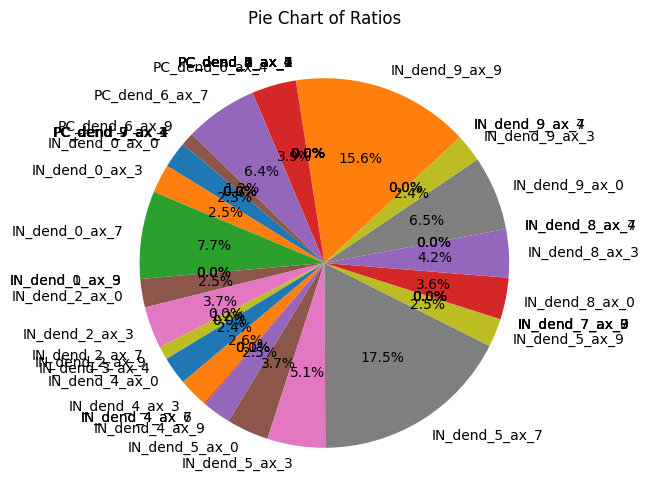

In [65]:
data1 = m_types_densities.T['CUL45purkinjelayer'].T / np.sum(m_types_densities.T['CUL45purkinjelayer'].T)
create_pie_chart(data1)

In [108]:
import json

# Opening JSON file
f = open('/Users/yroussel/Documents/projects/ion_channel_selector_v2/ion_channel_selector/output/inh_compatible_profiles.json')

# returns JSON object as 
# a dictionary
data = json.load(f)

In [109]:
list_inh = []l
for m in data.keys():
    for t in data[m].keys():
        if t not in list_inh:
            list_inh.append(t)

In [110]:
len(list_inh)

227

In [107]:
len(list_exc)

278

In [112]:
len(list_exc) + len(list_inh)

505

In [98]:
len(data.keys())

5114

In [111]:
list_inh

['0706 Lamp5 Gaba_1',
 '0707 Lamp5 Gaba_1',
 '0708 Lamp5 Gaba_1',
 '0709 Lamp5 Gaba_1',
 '0710 Lamp5 Gaba_1',
 '0711 Lamp5 Gaba_1',
 '0712 Lamp5 Gaba_1',
 '0713 Lamp5 Gaba_1',
 '0714 Lamp5 Gaba_2',
 '0715 Lamp5 Gaba_2',
 '0716 Lamp5 Gaba_2',
 '0717 Lamp5 Gaba_2',
 '0718 Lamp5 Gaba_2',
 '0719 Lamp5 Gaba_3',
 '0720 Lamp5 Gaba_3',
 '0721 Lamp5 Gaba_3',
 '0722 Lamp5 Gaba_4',
 '0723 Lamp5 Gaba_4',
 '0724 Lamp5 Lhx6 Gaba_1',
 '0725 Lamp5 Lhx6 Gaba_1',
 '0726 Lamp5 Lhx6 Gaba_1',
 '0727 Lamp5 Lhx6 Gaba_1',
 '0728 Lamp5 Lhx6 Gaba_1',
 '0729 Lamp5 Lhx6 Gaba_1',
 '0730 Lamp5 Lhx6 Gaba_1',
 '0731 Lamp5 Lhx6 Gaba_1',
 '0664 Sncg Gaba_1',
 '0665 Sncg Gaba_1',
 '0666 Sncg Gaba_1',
 '0667 Sncg Gaba_1',
 '0668 Sncg Gaba_1',
 '0669 Sncg Gaba_2',
 '0670 Sncg Gaba_2',
 '0671 Sncg Gaba_2',
 '0672 Sncg Gaba_3',
 '0673 Sncg Gaba_3',
 '0674 Sncg Gaba_3',
 '0675 Sncg Gaba_3',
 '0676 Sncg Gaba_3',
 '0677 Sncg Gaba_3',
 '0678 Sncg Gaba_4',
 '0679 Sncg Gaba_5',
 '0680 Sncg Gaba_5',
 '0681 Sncg Gaba_5',
 '0682 Snc

In [6]:
36000 * 100

3600000